In [ ]:
import pandas as pd, geopandas as gpd
import numpy as np
from shapely.geometry import Point, Polygon
from shapely.ops import unary_union

# --- Paths ---
BASE_DIR = "/Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data"
POI_FP   = f"{BASE_DIR}/edinburgh_pois.csv" 

def make_hex_grid(boundary_gdf, spacing=400):
    b = boundary_gdf.unary_union
    minx, miny, maxx, maxy = b.bounds
    dx = spacing * np.sqrt(3)   # horizontal spacing
    dy = spacing * 1.5          # vertical spacing
    cols = int(np.ceil((maxx - minx)/dx)) + 3
    rows = int(np.ceil((maxy - miny)/dy)) + 3
    polys = []
    for r in range(rows):
        y = miny + r*dy
        xoff = spacing*np.sqrt(3)/2 if r % 2 else 0.0
        for c in range(cols):
            x = minx + c*dx + xoff
            ang = np.deg2rad([0,60,120,180,240,300])
            verts = [(x + spacing*np.cos(t), y + spacing*np.sin(t)) for t in ang]
            hexagon = Polygon(verts)
            if hexagon.intersects(b):
                polys.append(hexagon.intersection(b))
    grid = gpd.GeoDataFrame(geometry=polys, crs=boundary_gdf.crs)
    grid = grid[grid.area > 10].copy()
    grid["zone_id"] = np.arange(1, len(grid)+1)
    grid["rep_point"] = grid.representative_point()
    return grid

# --- load POIs & stations ---
pois = pd.read_csv(POI_FP)

gdf_pois = gpd.GeoDataFrame(pois, geometry=gpd.points_from_xy(pois['lon'], pois['lat']), crs="EPSG:4326")

# project to metres (British National Grid) for geometry ops
gdf_pois_m = gdf_pois.to_crs(27700)

# --- Study area boundary ---
combined = gdf_pois_m[["geometry"]]
hull = unary_union(combined.geometry).convex_hull
boundary_gdf = gpd.GeoDataFrame({"name":["edinburgh_area"]}, geometry=[hull.buffer(500)], crs="EPSG:27700")

# --- Hex grid (~400 m) clipped to boundary ---
zones_m = make_hex_grid(boundary_gdf, spacing=400)

# --- Aggregate POIs per zone by category ---

pois_in = gpd.sjoin(gdf_pois_m, zones_m.set_geometry("geometry"), how="inner", predicate="within")[["zone_id", 'category']]


counts = pois_in.groupby(["zone_id", 'category']).size().reset_index(name="count")
counts_wide = counts.pivot(index="zone_id", columns='category', values="count").fillna(0).astype(int)
counts_wide.columns = [f"poi_{str(c).lower().replace(' ','_')}_count" for c in counts_wide.columns]


zones = zones_m.merge(counts_wide, how="left", left_on="zone_id", right_index=True)
for c in zones.columns:
    if c.startswith("poi_"): zones[c] = zones[c].fillna(0).astype(int)
if "poi_total_count" in zones.columns:
    zones["poi_total_count"] = zones["poi_total_count"].fillna(0).astype(int)

# Weighted POI score
weights = {}
for c in zones.columns:
    if c.startswith("poi_") and c.endswith("_count"):
        if any(k in c for k in ["residential","resid","home"]):          weights[c]=1.0
        elif any(k in c for k in ["school","sch"]):                      weights[c]=1.2
        elif any(k in c for k in ["uni","university","campus"]):         weights[c]=1.5
        elif any(k in c for k in ["commercial","com","office","biz"]):   weights[c]=1.3
        else:                                                            weights[c]=1.0

zones["poi_score"] = 0.0
for c,w in weights.items():
    if c in zones.columns: zones["poi_score"] += w * zones[c]

# --- Export ---
zones_wgs84    = zones.to_crs(4326).drop(columns=["rep_point"], errors="ignore")
boundary_wgs84 = boundary_gdf.to_crs(4326)

zones_wgs84.to_file(f"{BASE_DIR}/zones_hex_400m.geojson", driver="GeoJSON")
zones_wgs84.to_file(f"{BASE_DIR}/zones_hex_400m.gpkg", layer="zones", driver="GPKG")
zones_wgs84.drop(columns=["geometry"]).to_csv(f"{BASE_DIR}/zones_hex_400m.csv", index=False)
boundary_wgs84.to_file(f"{BASE_DIR}/edinburgh_boundary.geojson", driver="GeoJSON")



/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/1314458477.py:17: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  b = boundary_gdf.unary_union


In [ ]:
import folium
import numpy as np

# Map
m = folium.Map([55.9533, -3.1883], zoom_start=12, tiles='CartoDB.Voyager')
vals = zones_wgs84["poi_score"].fillna(0).values
vmin, vmax = np.percentile(vals, [5, 95])  # robust range to avoid huge outliers

def radius_from_value(v, vmin=vmin, vmax=vmax, rmin=4, rmax=25):
    v = max(vmin, min(v, vmax))
    # square-root scaling feels better for counts
    t = (np.sqrt(v - vmin) / np.sqrt(max(vmax - vmin, 1e-9))) if vmax > vmin else 0
    return rmin + t * (rmax - rmin)

for _, row in zones_wgs84.iterrows():
    pt = row.geometry.centroid
    r = radius_from_value(row["poi_score"])
    folium.CircleMarker(
        location=[pt.y, pt.x],
        radius=r,
        color="red",
        weight=1,
        fill=True,
        fill_color="red",
        fill_opacity=0.35,
        opacity=0.6,
        popup=f"Zone {row['zone_id']}<br>POI score: {row['poi_score']:.0f}"
    ).add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m

In [199]:
zones.to_csv("zones")
#zones = zones[zones['poi_score']>0]
zones

,geometry,zone_id,rep_point,poi_commercial_count,poi_hospital_count,poi_library_count,poi_residential_count,poi_school_count,poi_university_count,poi_score
0,"POLYGON ((323273.093 663799.001, 323277.446 66...",1,POINT (323257.238 663795.232),0,0,0,0,0,0,0.0
1,"POLYGON ((323565.914 663799.001, 323965.914 66...",2,POINT (323888.994 663742.006),0,0,0,0,0,0,0.0
2,"POLYGON ((324258.734 663799.001, 324658.734 66...",3,POINT (324458.734 663749.675),0,0,0,0,0,0,0.0
3,"POLYGON ((324951.554 663799.001, 325351.554 66...",4,POINT (325151.554 663717.367),0,0,0,0,0,0,0.0
4,"POLYGON ((325644.375 663799.001, 326044.375 66...",5,POINT (325844.375 663705.292),0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...
644,"POLYGON ((324165.914 677852.591, 323965.914 67...",645,POINT (323765.914 677679.386),0,0,0,0,0,0,0.0
645,"POLYGON ((324858.734 677852.591, 324658.734 67...",646,POINT (324458.734 677679.386),0,0,0,0,0,0,0.0
646,"POLYGON ((325551.554 677852.591, 325351.554 67...",647,POINT (325151.554 677679.386),0,0,0,0,0,0,0.0
647,"POLYGON ((326044.375 677506.181, 325644.375 67...",648,POINT (325844.375 677615.664),0,0,0,0,0,0,0.0


In [200]:
# Add longitude and latitude columns for each zone centroid
zones_wgs84['longitude'] = zones_wgs84.geometry.centroid.x
zones_wgs84['latitude'] = zones_wgs84.geometry.centroid.y

# Also add to the zones dataframe (in original CRS)
zones['longitude'] = zones_wgs84['longitude']
zones['latitude'] = zones_wgs84['latitude']

print(f"Added longitude and latitude columns to zones dataframe")
zones[['zone_id', 'longitude', 'latitude', 'poi_score']].head(10)

Added longitude and latitude columns to zones dataframe


/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4227796766.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zones_wgs84['longitude'] = zones_wgs84.geometry.centroid.x
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4227796766.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  zones_wgs84['latitude'] = zones_wgs84.geometry.centroid.y


,zone_id,longitude,latitude,poi_score
0,1,-3.227775,55.861218,0.0
1,2,-3.218992,55.861053,0.0
2,3,-3.208099,55.860836,0.0
3,4,-3.197284,55.860688,0.0
4,5,-3.186238,55.860708,0.0
5,6,-3.175170,55.860731,0.0
6,7,-3.164102,55.860752,0.0
7,8,-3.153034,55.860771,0.0
8,9,-3.141965,55.860789,0.0
9,10,-3.130896,55.860806,0.0


In [ ]:
# Extract population data from raster and calculate density
import rasterio
from rasterstats import zonal_stats

# Load raster
POP_RASTER_FP = f"{BASE_DIR}/population_density_2020.tif"
print(f"\n📂 Loading raster: {POP_RASTER_FP}")

with rasterio.open(POP_RASTER_FP) as src:
    print(f"   CRS: {src.crs}")
    print(f"   Shape: {src.shape}")
    raster_crs = src.crs

# Reproject zones to raster CRS
zones_pop = zones_m.to_crs(raster_crs)

# Calculate zonal statistics
print(f"\n📈 Calculating zonal statistics...")
stats = zonal_stats(zones_pop.geometry, POP_RASTER_FP, stats=['sum', 'mean'], nodata=-9999)

# Add population data
zones_m['population_2021'] = [s['sum'] if s['sum'] is not None else 0 for s in stats]
zones_m['population_2021'] = zones_m['population_2021'].fillna(0)

# Calculate zone area in km²
zones_m['area_km2'] = zones_m.geometry.area / 1_000_000

# Calculate population density (people per km²)
zones_m['population_density'] = zones_m['population_2021'] / zones_m['area_km2']
zones_m['population_density'] = zones_m['population_density'].fillna(0)

print(f"\n✅ Complete!")
print(f"\n📊 Population Statistics:")
print(f"   Total population: {zones_m['population_2021'].sum():,.0f}")
print(f"   Zones with population > 0: {(zones_m['population_2021'] > 0).sum()}")
print(f"\n📊 Density Statistics:")
print(f"   Average density (people/km²): {zones_m['population_density'].mean():,.2f}")
print(f"   Max density (people/km²): {zones_m['population_density'].max():,.2f}")

# Update other dataframes using merge to handle any row mismatches
pop_data = zones_m[['zone_id', 'population_2021', 'population_density', 'area_km2']].copy()

# Merge with zones
if 'population_2021' in zones.columns:
    zones = zones.drop(columns=['population_2021', 'population_density', 'area_km2'], errors='ignore')
zones = zones.merge(pop_data, on='zone_id', how='left')

# Merge with zones_wgs84
if 'population_2021' in zones_wgs84.columns:
    zones_wgs84 = zones_wgs84.drop(columns=['population_2021', 'population_density', 'area_km2'], errors='ignore')
zones_wgs84 = zones_wgs84.merge(pop_data, on='zone_id', how='left')

# Fill any remaining NaNs with 0
for df in [zones, zones_wgs84]:
    df['population_2021'] = df['population_2021'].fillna(0)
    df['population_density'] = df['population_density'].fillna(0)
    df['area_km2'] = df['area_km2'].fillna(0)

EXTRACTING POPULATION DATA AND CALCULATING DENSITY

📂 Loading raster: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/population_density_2020.tif
   CRS: EPSG:4326
   Shape: (1321, 1250)

📈 Calculating zonal statistics...

✅ Complete!

📊 Population Statistics:
   Total population: -141,948
   Zones with population > 0: 432

📊 Density Statistics:
   Average density (people/km²): -2,051.28
   Max density (people/km²): 66,369.45

📍 Top 10 zones by density:
 zone_id  population_2021  area_km2  population_density
     540     27589.261719  0.415692        66369.448667
     541     19970.693359  0.415692        48042.021612
     454     17636.550781  0.415692        42426.947255
     456     16611.277344  0.415692        39960.522692
     589     15072.898438  0.415692        36259.758210
     543     14957.939453  0.415692        35983.209874
     426     14779.291992  0.415692        3555

In [202]:
zones_m[zones_m['population_2021']>0][['zone_id', 'population_2021', 'area_km2', 'population_density']]

,zone_id,population_2021,area_km2,population_density
9,10,10.921470,0.154986,70.467557
10,11,8.832861,0.166954,52.905843
11,12,660.374329,0.179234,3684.424647
12,13,1008.588013,0.190074,5306.300368
13,14,35.681606,0.197418,180.741497
...,...,...,...,...
642,643,140.726456,0.224222,627.622031
643,644,1344.147217,0.240742,5583.351942
644,645,349.195801,0.239660,1457.046589
645,646,17.042732,0.231531,73.608780


In [ ]:
import os
import pandas as pd
import geopandas as gpd

print("="*100)
print("EXTRACTING STATION DATA FROM TRIP FILES")
print("="*100)

# *** DEFINE PARAMETERS ***
YEAR = 2020
START_MONTH = 7   # July
END_MONTH = 12    # December

# Load trip data files
trip_files_2020 = sorted([
    f'{BASE_DIR}/cyclehire-cleandata/{YEAR}_{str(m).zfill(2)}.csv' 
    for m in range(START_MONTH, END_MONTH + 1)
])

existing_files = [f for f in trip_files_2020 if os.path.exists(f)]
trips_2020 = pd.concat(
    (pd.read_csv(f) for f in existing_files),
    ignore_index=True
)

print(f"\nLoaded {len(existing_files)} trip files")
print(f"Total trips: {len(trips_2020):,}")

# Extract unique START stations
start_stations = trips_2020[['start_station_id', 'start_station_name', 
                              'start_station_latitude', 'start_station_longitude']].drop_duplicates()
start_stations = start_stations.rename(columns={
    'start_station_id': 'station_id',
    'start_station_name': 'name',
    'start_station_latitude': 'lat',
    'start_station_longitude': 'lon'
})

# Extract unique END stations
end_stations = trips_2020[['end_station_id', 'end_station_name',
                            'end_station_latitude', 'end_station_longitude']].drop_duplicates()
end_stations = end_stations.rename(columns={
    'end_station_id': 'station_id',
    'end_station_name': 'name',
    'end_station_latitude': 'lat',
    'end_station_longitude': 'lon'
})

# Combine and keep first occurrence of each station_id
stns = pd.concat([start_stations, end_stations], ignore_index=True)
stns = stns.drop_duplicates(subset=['station_id'], keep='first')
stns = stns.dropna(subset=['station_id', 'lat', 'lon'])

print(f"\n✅ Extracted {len(stns)} unique stations from trip data")
print(f"   Columns: {list(stns.columns)}")
print(f"   Sample stations:")
print(stns.head(10).to_string(index=False))

# Create GeoDataFrames
gdf_stns = gpd.GeoDataFrame(
    stns, 
    geometry=gpd.points_from_xy(stns['lon'], stns['lat']), 
    crs="EPSG:4326"
)
gdf_stns_m = gdf_stns.to_crs(27700)

print(f"\n✅ Station GeoDataFrames created")
print(f"   gdf_stns: {len(gdf_stns)} stations (EPSG:4326)")
print(f"   gdf_stns_m: {len(gdf_stns_m)} stations (EPSG:27700)")

EXTRACTING STATION DATA FROM TRIP FILES

Loaded 6 trip files
Total trips: 127,451

✅ Extracted 112 unique stations from trip data
   Columns: ['station_id', 'name', 'lat', 'lon']
   Sample stations:
 station_id                    name       lat       lon
       1720           Dundas Street 55.960762 -3.201278
        296          Castle Terrace 55.946766 -3.202038
       1090       Hillside Crescent 55.957872 -3.175888
       1870              Hawes Pier 55.990530 -3.385597
       1798         Chambers Street 55.947600 -3.188920
       1730      East London Street 55.959954 -3.187198
       1025          Dundee Terrace 55.939710 -3.220589
       1039            Lothian Road 55.947409 -3.205765
       1737          Inverleith Row 55.964118 -3.202095
       1728 Portobello - Kings Road 55.957915 -3.118332

✅ Station GeoDataFrames created
   gdf_stns: 112 stations (EPSG:4326)
   gdf_stns_m: 112 stations (EPSG:27700)


In [ ]:
# Check for station mismatches

stations_in_trips_start = set(trips_2020['start_station_id'].dropna().unique())
stations_in_trips_end = set(trips_2020['end_station_id'].dropna().unique())
stations_in_trips_all = stations_in_trips_start.union(stations_in_trips_end)

print(f"\n📊 TRIP DATA:")
print(f"   Unique stations as START point: {len(stations_in_trips_start)}")
print(f"   Unique stations as END point: {len(stations_in_trips_end)}")
print(f"   Total unique stations in trips: {len(stations_in_trips_all)}")

stations_in_reference = set(stns['station_id'].unique())
print(f"\n📁 STATION REFERENCE FILE (station_data.csv):")
print(f"   Total stations: {len(stations_in_reference)}")

# Find missing stations
missing_from_reference = stations_in_trips_all - stations_in_reference
print(f"\n🔴 STATIONS IN TRIPS BUT NOT IN REFERENCE FILE:")
print(f"   Count: {len(missing_from_reference)}")
if len(missing_from_reference) > 0:
    print(f"   Missing station IDs: {sorted(missing_from_reference)}")
    
    # Show trip counts for missing stations
    print(f"\n   📈 Trip activity for missing stations:")
    for sid in sorted(missing_from_reference):
        dep_count = (trips_2020['start_station_id'] == sid).sum()
        arr_count = (trips_2020['end_station_id'] == sid).sum()
        total = dep_count + arr_count
        print(f"      Station {sid}: {dep_count:,} departures + {arr_count:,} arrivals = {total:,} total")

# Find unused stations
unused_stations = stations_in_reference - stations_in_trips_all
print(f"\n⚪ STATIONS IN REFERENCE FILE BUT NOT USED IN TRIPS:")
print(f"   Count: {len(unused_stations)}")
if len(unused_stations) > 0:
    print(f"   Unused station IDs: {sorted(unused_stations)}")

# Summary
print("\n" + "="*100)
print("SUMMARY")
print("="*100)
print(f"✅ Stations correctly matched: {len(stations_in_reference.intersection(stations_in_trips_all))}")
print(f"🔴 Missing from reference file: {len(missing_from_reference)}")
print(f"⚪ In reference but unused: {len(unused_stations)}")
print("="*100)

DIAGNOSING STATION DATA MISMATCH

📊 TRIP DATA:
   Unique stations as START point: 111
   Unique stations as END point: 112
   Total unique stations in trips: 112

📁 STATION REFERENCE FILE (station_data.csv):
   Total stations: 112

🔴 STATIONS IN TRIPS BUT NOT IN REFERENCE FILE:
   Count: 0

⚪ STATIONS IN REFERENCE FILE BUT NOT USED IN TRIPS:
   Count: 0

SUMMARY
✅ Stations correctly matched: 112
🔴 Missing from reference file: 0
⚪ In reference but unused: 0


In [ ]:
# ======================================================================
# ASSIGN ALL STATIONS TO NEAREST ZONE
# ======================================================================

from scipy.spatial import cKDTree
import numpy as np

existing_station_ids = gpd.sjoin(
    gdf_stns_m,
    zones_m[['zone_id', 'geometry']],
    how='left',
    predicate='within'
)[['station_id', 'zone_id']]

print(f"\n📊 After spatial join (BEFORE removing duplicates):")
print(f"   Total rows: {len(existing_station_ids)}")
print(f"   Unique stations: {existing_station_ids['station_id'].nunique()}")
print(f"   Assigned: {existing_station_ids['zone_id'].notna().sum()}")
print(f"   Unassigned: {existing_station_ids['zone_id'].isna().sum()}")

# Print duplicate rows in existing_station_ids
duplicates = existing_station_ids[existing_station_ids['station_id'].duplicated(keep=False)]
if len(duplicates) > 0:
    print(f"Found {len(duplicates)} duplicate rows:")
    print(duplicates.sort_values('station_id'))
else:
    print("No duplicate rows found in existing_station_ids")

existing_station_ids = existing_station_ids.drop_duplicates(subset=['station_id'], keep='first')

print(f"\n📊 After removing duplicates:")
print(f"   Total stations: {len(existing_station_ids)}")
print(f"   Unique station IDs: {existing_station_ids['station_id'].nunique()}")
print(f"   Assigned: {existing_station_ids['zone_id'].notna().sum()}")
print(f"   Unassigned: {existing_station_ids['zone_id'].isna().sum()}")

# Verify we have exactly 112 stations
if len(existing_station_ids) != 112:
    print(f"\n⚠️  WARNING: Expected 112 stations, but got {len(existing_station_ids)}")
else:
    print(f"\n✅ Correct number of stations: 112")

# Find unassigned stations ----
unassigned_mask = existing_station_ids['zone_id'].isna()
unassigned_count = unassigned_mask.sum()

if unassigned_count > 0:
    print(f"\n🔴 Found {unassigned_count} unassigned stations")
    print(f"   Unassigned station IDs: {existing_station_ids[unassigned_mask]['station_id'].tolist()}")
    
    # Get unassigned stations from gdf_stns_m
    unassigned_station_ids = existing_station_ids[unassigned_mask]['station_id'].values
    unassigned_stations = gdf_stns_m[gdf_stns_m['station_id'].isin(unassigned_station_ids)].copy()
    
    print(f"\n   Unassigned stations details:")
    for idx, row in unassigned_stations.iterrows():
        print(f"      Station {row['station_id']}: {row['name']} at ({row.geometry.x:.2f}, {row.geometry.y:.2f})")
    
    # ---- Build KD-tree for zone centroids ----
    zone_centroids = zones_m.copy()
    zone_centroids['centroid'] = zone_centroids.geometry.centroid
    zone_centroids['x'] = zone_centroids['centroid'].x
    zone_centroids['y'] = zone_centroids['centroid'].y
    
    zone_coords = zone_centroids[['x', 'y']].values
    tree = cKDTree(zone_coords)
    
    # ---- Find nearest zone for each unassigned station ----
    station_coords = np.column_stack([unassigned_stations.geometry.x, unassigned_stations.geometry.y])
    distances, indices = tree.query(station_coords)
    
    # Get nearest zone IDs
    nearest_zones = zone_centroids.iloc[indices]['zone_id'].values
    
    # ---- Update existing_station_ids ----
    print(f"\n🔧 Assigning stations to nearest zones:")
    for i, station_id in enumerate(unassigned_stations['station_id'].values):
        nearest_zone = nearest_zones[i]
        distance = distances[i]
        
        # Update the zone_id for this station
        existing_station_ids.loc[existing_station_ids['station_id'] == station_id, 'zone_id'] = nearest_zone
        
        print(f"   ✓ Station {station_id} → Zone {nearest_zone} (distance: {distance:.0f}m)")
    
    # ---- Verify all assigned ----
    still_unassigned = existing_station_ids['zone_id'].isna().sum()
    print(f"\n✅ Assignment complete!")
    print(f"   Remaining unassigned: {still_unassigned}")
    
    if still_unassigned == 0:
        print(f"   🎉 All {len(existing_station_ids)} stations now assigned to zones!")
    else:
        print(f"   ⚠️  Warning: {still_unassigned} stations still unassigned")
        print(f"   Unassigned IDs: {existing_station_ids[existing_station_ids['zone_id'].isna()]['station_id'].tolist()}")
else:
    print("\n✅ All stations already assigned to zones!")

# ---- Final verification ----
print("\n" + "="*80)
print("FINAL VERIFICATION")
print("="*80)
print(f"Total stations: {len(existing_station_ids)}")
print(f"Unique station IDs: {existing_station_ids['station_id'].nunique()}")
print(f"Assigned to zones: {existing_station_ids['zone_id'].notna().sum()}")
print(f"Unassigned: {existing_station_ids['zone_id'].isna().sum()}")
print(f"\nZones with stations: {existing_station_ids['zone_id'].nunique()}")

# Verify no duplicates
if existing_station_ids['station_id'].duplicated().any():
    print(f"\n⚠️  WARNING: Found duplicate station IDs!")
    duplicates = existing_station_ids[existing_station_ids['station_id'].duplicated(keep=False)]
    print(duplicates)
else:
    print(f"\n✅ No duplicate station IDs - all {len(existing_station_ids)} stations are unique")

print("="*80)

ASSIGNING ALL STATIONS TO NEAREST ZONE (IMPROVED)

📊 Verifying station count before assignment:
   gdf_stns: 112 stations
   gdf_stns_m: 112 stations
   Unique station IDs in gdf_stns: 112
   Unique station IDs in gdf_stns_m: 112

📊 After spatial join (BEFORE removing duplicates):
   Total rows: 119
   Unique stations: 112
   Assigned: 106
   Unassigned: 13
Found 14 duplicate rows:
     station_id  zone_id
82          253    342.0
82          253    343.0
83          256    484.0
83          256    513.0
86         1019    454.0
86         1019    483.0
47         1726    455.0
47         1726    456.0
16         1727    399.0
16         1727    427.0
27         1814    513.0
27         1814    514.0
100        1820    243.0
100        1820    271.0

📊 After removing duplicates:
   Total stations: 112
   Unique station IDs: 112
   Assigned: 99
   Unassigned: 13

✅ Correct number of stations: 112

🔴 Found 13 unassigned stations
   Unassigned station IDs: [1870, 1747, 1722, 1743, 1869, 1

In [ ]:
# ======================================================================
# ASSIGN STATIONS USING ZONE BOUNDING BOX AS EDINBURGH BOUNDARY
# ======================================================================

from scipy.spatial import cKDTree
import numpy as np
from shapely.geometry import box

print("="*80)
print("ASSIGNING STATIONS USING ZONE BOUNDING BOX AS EDINBURGH BOUNDARY")
print("="*80)

# Create Edinburgh boundary from zones' bounding box ***
print(f"\n📊 Creating Edinburgh boundary from zone bounding box...")

# Get min/max coordinates from all zones
lon_min = zones_m.geometry.bounds['minx'].min()
lon_max = zones_m.geometry.bounds['maxx'].max()
lat_min = zones_m.geometry.bounds['miny'].min()
lat_max = zones_m.geometry.bounds['maxy'].max()

print(f"   Longitude range: {lon_min:.2f} to {lon_max:.2f}")
print(f"   Latitude range: {lat_min:.2f} to {lat_max:.2f}")

# Create rectangular boundary from bounding box
edinburgh_boundary_box = box(lon_min, lat_min, lon_max, lat_max)
edinburgh_boundary_gdf = gpd.GeoDataFrame(
    {'name': ['edinburgh']}, 
    geometry=[edinburgh_boundary_box], 
    crs=zones_m.crs
)

print(f"   Boundary box created")

# *** Filter stations to only those INSIDE the bounding box ***
print(f"\n📊 Checking which stations are inside Edinburgh bounding box...")
print(f"   Total stations before filtering: {len(gdf_stns_m)}")

# Check which stations are within the bounding box
stations_inside_boundary = gdf_stns_m[
    (gdf_stns_m.geometry.x >= lon_min) &
    (gdf_stns_m.geometry.x <= lon_max) &
    (gdf_stns_m.geometry.y >= lat_min) &
    (gdf_stns_m.geometry.y <= lat_max)
].copy()

print(f"   Stations INSIDE Edinburgh bounding box: {len(stations_inside_boundary)}")
print(f"   Stations OUTSIDE Edinburgh bounding box: {len(gdf_stns_m) - len(stations_inside_boundary)}")

if len(gdf_stns_m) - len(stations_inside_boundary) > 0:
    stations_outside = gdf_stns_m[~gdf_stns_m['station_id'].isin(stations_inside_boundary['station_id'])]
    print(f"\n   ⚠️  Stations outside Edinburgh bounding box (will NOT be assigned):")
    for idx, row in stations_outside.iterrows():
        station_name = row.get('name', 'Unknown')
        print(f"      Station {row['station_id']}: {station_name} at ({row.geometry.x:.2f}, {row.geometry.y:.2f})")

# *** Assign all stations inside bounding box to nearest zone ***
print(f"\n📊 Assigning all {len(stations_inside_boundary)} stations inside boundary to nearest zones...")

# Build KD-tree for zone centroids
zone_centroids = zones_m.copy()
zone_centroids['centroid'] = zone_centroids.geometry.centroid
zone_centroids['x'] = zone_centroids['centroid'].x
zone_centroids['y'] = zone_centroids['centroid'].y

zone_coords = zone_centroids[['x', 'y']].values
tree = cKDTree(zone_coords)

# Find nearest zone for each station inside boundary
station_coords = np.column_stack([stations_inside_boundary.geometry.x, stations_inside_boundary.geometry.y])
distances, indices = tree.query(station_coords)

# Get nearest zone IDs
nearest_zones = zone_centroids.iloc[indices]['zone_id'].values

# Create the station-to-zone assignment dataframe
existing_station_ids = pd.DataFrame({
    'station_id': stations_inside_boundary['station_id'].values,
    'zone_id': nearest_zones
})

print(f"\n🔧 Station assignments (showing first 20 and last 10):")
for i, row in existing_station_ids.head(20).iterrows():
    station_id = row['station_id']
    zone_id = row['zone_id']
    distance = distances[i]
    station_name = stations_inside_boundary[stations_inside_boundary['station_id'] == station_id]['name'].values[0]
    print(f"   ✓ Station {station_id} ({station_name}) → Zone {zone_id} (distance: {distance:.0f}m)")

if len(existing_station_ids) > 30:
    print("   ... (middle stations omitted) ...")
    for i, row in existing_station_ids.tail(10).iterrows():
        station_id = row['station_id']
        zone_id = row['zone_id']
        idx = existing_station_ids.index.get_loc(i)
        distance = distances[idx]
        station_name = stations_inside_boundary[stations_inside_boundary['station_id'] == station_id]['name'].values[0]
        print(f"   ✓ Station {station_id} ({station_name}) → Zone {zone_id} (distance: {distance:.0f}m)")

# *** Check for the specific stations mentioned ***
check_stations = [1722, 1747, 1743]
print(f"\n🔍 Checking specific stations: {check_stations}")
for sid in check_stations:
    if sid in existing_station_ids['station_id'].values:
        zone = existing_station_ids[existing_station_ids['station_id'] == sid]['zone_id'].values[0]
        station_info = gdf_stns_m[gdf_stns_m['station_id'] == sid].iloc[0]
        print(f"   ✅ Station {sid} ({station_info['name']}) is ASSIGNED to Zone {zone}")
    else:
        if sid in gdf_stns['station_id'].values:
            station_info = gdf_stns[gdf_stns['station_id'] == sid].iloc[0]
            print(f"   ❌ Station {sid} ({station_info['name']}) is OUTSIDE boundary at ({station_info.geometry.x:.2f}, {station_info.geometry.y:.2f})")
        else:
            print(f"   ❌ Station {sid} does NOT exist in station data")

# *** Final verification ***
print("\n" + "="*80)
print("FINAL VERIFICATION")
print("="*80)
print(f"Total stations processed: {len(existing_station_ids)}")
print(f"Assigned to zones: {existing_station_ids['zone_id'].notna().sum()}")
print(f"Unassigned: {existing_station_ids['zone_id'].isna().sum()}")
print(f"Zones with stations: {existing_station_ids['zone_id'].nunique()}")

# Verify no duplicates
if existing_station_ids['station_id'].duplicated().any():
    print(f"\n⚠️  WARNING: Found duplicate station IDs!")
    duplicates = existing_station_ids[existing_station_ids['station_id'].duplicated(keep=False)]
    print(duplicates)
else:
    print(f"\n✅ No duplicate station IDs - all {len(existing_station_ids)} stations are unique")

print("="*80)

ASSIGNING STATIONS USING ZONE BOUNDING BOX AS EDINBURGH BOUNDARY

📊 Creating Edinburgh boundary from zone bounding box...
   Longitude range: 316144.89 to 335376.74
   Latitude range: 663452.59 to 677901.68
   Boundary box created

📊 Checking which stations are inside Edinburgh bounding box...
   Total stations before filtering: 112
   Stations INSIDE Edinburgh bounding box: 102
   Stations OUTSIDE Edinburgh bounding box: 10

   ⚠️  Stations outside Edinburgh bounding box (will NOT be assigned):
      Station 1870: Hawes Pier at (313661.29, 678373.75)
      Station 1869: Hopetoun Road at (312474.87, 678359.04)
      Station 1868: Forth Bridge Visitors Centre at (312522.47, 678086.53)
      Station 1877: Port Edgar Marina at (312321.95, 678671.11)
      Station 1871: Scotstoun House at (313102.81, 677335.98)
      Station 1866: The Loan at (312900.34, 678318.96)
      Station 1874: Tesco Ferrymuir at (312663.25, 677640.90)
      Station 1860: Ingliston Park & Ride at (315422.23, 672578.

In [207]:
# ======================================================================
# PLOT STATIONS AND THEIR ASSIGNED ZONES
# ======================================================================

import folium
from folium import plugins
import matplotlib.colors as mcolors

print("="*100)
print("CREATING MAP: STATIONS AND ASSIGNED ZONES")
print("="*100)

# Merge station data with zone assignments
stations_with_zones = gdf_stns.merge(
    existing_station_ids[['station_id', 'zone_id']], 
    on='station_id', 
    how='left'
)

# Check how many stations are assigned to zones
assigned_count = stations_with_zones['zone_id'].notna().sum()
unassigned_count = stations_with_zones['zone_id'].isna().sum()

print(f"\n📊 Station Assignment Summary:")
print(f"   Total stations: {len(stations_with_zones)}")
print(f"   Assigned to zones: {assigned_count}")
print(f"   Unassigned (outside zones): {unassigned_count}")

# Create base map centered on Edinburgh
center_lat = stations_with_zones.geometry.y.mean()
center_lon = stations_with_zones.geometry.x.mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=12,
    tiles='CartoDB Positron'
)

# ===== 1. ADD ZONE POLYGONS =====
print("\n🗺️  Adding zone polygons...")

# Get zones with at least one station
zones_with_stations = zones_wgs84[zones_wgs84['zone_id'].isin(stations_with_zones['zone_id'].dropna())]
zones_without_stations = zones_wgs84[~zones_wgs84['zone_id'].isin(stations_with_zones['zone_id'].dropna())]

print(f"   Zones with stations: {len(zones_with_stations)}")
print(f"   Zones without stations: {len(zones_without_stations)}")

# Add zones WITH stations (colored)
folium.GeoJson(
    zones_with_stations,
    name='Zones with Stations',
    style_function=lambda x: {
        'fillColor': '#3388ff',
        'color': '#2c5aa0',
        'weight': 2,
        'fillOpacity': 0.3
    },
    highlight_function=lambda x: {
        'fillColor': '#ffff00',
        'color': '#ff8800',
        'weight': 3,
        'fillOpacity': 0.5
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['zone_id', 'poi_score', 'population_density'],
        aliases=['Zone ID:', 'POI Score:', 'Pop. Density:'],
        localize=True,
        style='background-color: white; color: black; font-size: 12px; padding: 10px;'
    )
).add_to(m)

# Add zones WITHOUT stations (faded)
folium.GeoJson(
    zones_without_stations,
    name='Zones without Stations',
    style_function=lambda x: {
        'fillColor': '#cccccc',
        'color': '#999999',
        'weight': 1,
        'fillOpacity': 0.1
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['zone_id'],
        aliases=['Zone ID:'],
        localize=True
    )
).add_to(m)

# ===== 2. ADD STATIONS =====
print("\n📍 Adding station markers...")

# Add ASSIGNED stations (green circles)
for idx, row in stations_with_zones[stations_with_zones['zone_id'].notna()].iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=6,
        popup=folium.Popup(
            f"<b>Station ID:</b> {row['station_id']}<br>"
            f"<b>Station Name:</b> {row['name']}<br>"
            f"<b>Assigned to Zone:</b> {int(row['zone_id'])}",
            max_width=250
        ),
        tooltip=f"Station: {row['name']} → Zone {int(row['zone_id'])}",
        color='darkgreen',
        fill=True,
        fillColor='green',
        fillOpacity=0.7,
        weight=2
    ).add_to(m)

# Add UNASSIGNED stations (red circles)
for idx, row in stations_with_zones[stations_with_zones['zone_id'].isna()].iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=6,
        popup=folium.Popup(
            f"<b>Station ID:</b> {row['station_id']}<br>"
            f"<b>Station Name:</b> {row['name']}<br>"
            f"<b>Status:</b> ⚠️ Not assigned to any zone",
            max_width=250
        ),
        tooltip=f"⚠️ Unassigned: {row['name']}",
        color='darkred',
        fill=True,
        fillColor='red',
        fillOpacity=0.7,
        weight=2
    ).add_to(m)

# ===== 3. ADD LEGEND =====
legend_html = '''
<div style="position: fixed; 
     bottom: 50px; right: 50px; width: 220px; height: auto; 
     background-color: white; border:2px solid grey; z-index:9999; 
     font-size:14px; padding: 10px">
     <p style="margin:0; font-weight:bold; text-align:center;">Legend</p>
     <hr style="margin:5px 0;">
     <p style="margin:5px 0;">
         <span style="background-color:#3388ff; opacity:0.3; border:2px solid #2c5aa0; 
                      padding: 5px 10px; display:inline-block;">&nbsp;&nbsp;&nbsp;</span>
         Zones with Stations
     </p>
     <p style="margin:5px 0;">
         <span style="background-color:#cccccc; opacity:0.1; border:1px solid #999999; 
                      padding: 5px 10px; display:inline-block;">&nbsp;&nbsp;&nbsp;</span>
         Zones without Stations
     </p>
     <p style="margin:5px 0;">
         <span style="background-color:green; border-radius:50%; border:2px solid darkgreen; 
                      padding: 3px 6px; display:inline-block;">&nbsp;&nbsp;</span>
         Assigned Stations (''' + str(assigned_count) + ''')
     </p>
     <p style="margin:5px 0;">
         <span style="background-color:red; border-radius:50%; border:2px solid darkred; 
                      padding: 3px 6px; display:inline-block;">&nbsp;&nbsp;</span>
         Unassigned Stations (''' + str(unassigned_count) + ''')
     </p>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Add layer control
folium.LayerControl(collapsed=False).add_to(m)

# Add fullscreen option
plugins.Fullscreen().add_to(m)

print("\n✅ Map created successfully!")
print("\n" + "="*100)
print("DISPLAYING INTERACTIVE MAP")
print("="*100)
print("\n💡 TIP: Click on stations to see details | Hover over zones to see info")
print("🎨 GREEN circles = Stations assigned to zones")
print("🔴 RED circles = Stations not assigned to any zone")
print("="*100)

# Display the map
m

CREATING MAP: STATIONS AND ASSIGNED ZONES

📊 Station Assignment Summary:
   Total stations: 112
   Assigned to zones: 102
   Unassigned (outside zones): 10

🗺️  Adding zone polygons...
   Zones with stations: 64
   Zones without stations: 585

📍 Adding station markers...

✅ Map created successfully!

DISPLAYING INTERACTIVE MAP

💡 TIP: Click on stations to see details | Hover over zones to see info
🎨 GREEN circles = Stations assigned to zones
🔴 RED circles = Stations not assigned to any zone


In [ ]:
# ======================================================================
# AGGREGATE 2020 TRIP DATA BY ZONE
# ======================================================================

# Aggregate departures by zone
departures_by_zone = trips_2020.merge(
    existing_station_ids[['station_id', 'zone_id']], 
    left_on='start_station_id', 
    right_on='station_id', 
    how='left'
).groupby('zone_id').size().reset_index(name='total_departures_2020')

# Aggregate arrivals by zone
arrivals_by_zone = trips_2020.merge(
    existing_station_ids[['station_id', 'zone_id']], 
    left_on='end_station_id', 
    right_on='station_id', 
    how='left'
).groupby('zone_id').size().reset_index(name='total_arrivals_2020')

# Merge with zones dataframe
zones_2020 = zones.merge(departures_by_zone, on='zone_id', how='left')
zones_2020 = zones_2020.merge(arrivals_by_zone, on='zone_id', how='left')

# Fill NaN values with 0
zones_2020['total_departures_2020'] = zones_2020['total_departures_2020'].fillna(0).astype(int)
zones_2020['total_arrivals_2020'] = zones_2020['total_arrivals_2020'].fillna(0).astype(int)
zones_2020['actual_demand_2020'] = zones_2020['total_departures_2020'] + zones_2020['total_arrivals_2020']

print(f"\nZones with 2020 data: {len(zones_2020)}")
print(f"Zones with demand > 0: {(zones_2020['actual_demand_2020'] > 0).sum()}")
print(f"Total departures: {zones_2020['total_departures_2020'].sum():,}")
print(f"Total arrivals: {zones_2020['total_arrivals_2020'].sum():,}")
print("\n" + "="*80)

# Prepare data for modeling - only use zones with demand > 0
zones_for_model_arr_dep = zones_2020[zones_2020['actual_demand_2020'] > 0].copy()

AGGREGATING 2020 TRIP DATA BY ZONE

Zones with 2020 data: 383
Zones with demand > 0: 61
Total departures: 121,025
Total arrivals: 119,826



In [ ]:
# ======================================================================
# ADABOOST MODELS FOR ARRIVALS AND DEPARTURES
# ======================================================================

# Prepare data for modeling - only use zones with demand > 0
zones_for_model_arr_dep = zones_2020[zones_2020['actual_demand_2020'] > 0].copy()

print("="*80)
print("PREPARING DATA FOR ARRIVALS AND DEPARTURES PREDICTION")
print("="*80)
print(f"\nZones with demand for modeling: {len(zones_for_model_arr_dep)}")
print(f"\nTarget variables statistics:")
print(f"  Total Departures - Mean: {zones_for_model_arr_dep['total_departures_2020'].mean():.2f}, Std: {zones_for_model_arr_dep['total_departures_2020'].std():.2f}")
print(f"  Total Arrivals - Mean: {zones_for_model_arr_dep['total_arrivals_2020'].mean():.2f}, Std: {zones_for_model_arr_dep['total_arrivals_2020'].std():.2f}")

# Select features for modeling: longitude, latitude, POI category counts, and population density
feature_cols_arr_dep = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                        'poi_library_count', 'poi_school_count', 
                        'poi_university_count', 'population_density']

print(f"\nFeatures for modeling: {feature_cols_arr_dep}")

# Prepare features
X_arr_dep = zones_for_model_arr_dep[feature_cols_arr_dep].fillna(0)

# Prepare targets (departures and arrivals)

y_departures_2020 = zones_for_model_arr_dep['total_departures_2020']/184
y_arrivals_2020 = zones_for_model_arr_dep['total_arrivals_2020']/184

print(f"\nFeature matrix shape: {X_arr_dep.shape}")
print(f"Departures target shape: {y_departures_2020.shape}")
print(f"Arrivals target shape: {y_arrivals_2020.shape}")

# Split data into train and test sets
from sklearn.model_selection import train_test_split

X_train_arr_dep, X_test_arr_dep, y_train_dep, y_test_dep, y_train_arr, y_test_arr = train_test_split(
    X_arr_dep, y_departures_2020, y_arrivals_2020, test_size=0.1, random_state=42
)

print(f"\nTrain set size: {len(X_train_arr_dep)}")
print(f"Test set size: {len(X_test_arr_dep)}")
print("\n" + "="*80)

PREPARING DATA FOR ARRIVALS AND DEPARTURES PREDICTION

Zones with demand for modeling: 61

Target variables statistics:
  Total Departures - Mean: 1984.02, Std: 1927.06
  Total Arrivals - Mean: 1964.36, Std: 1719.49

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (61, 8)
Departures target shape: (61,)
Arrivals target shape: (61,)

Train set size: 54
Test set size: 7



In [211]:
# ======================================================================
# TRAIN ADABOOST FOR DEPARTURES PREDICTION
# ======================================================================

from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("TRAINING ADABOOST MODEL FOR DEPARTURES PREDICTION")
print("="*80)

# Train AdaBoost for Departures
ada_departures = AdaBoostRegressor(n_estimators=100, random_state=42, learning_rate=0.01)
ada_departures.fit(X_train_arr_dep, y_train_dep)

# Make predictions
y_train_pred_dep = ada_departures.predict(X_train_arr_dep)
y_test_pred_dep = ada_departures.predict(X_test_arr_dep)

# Evaluate model
print("\n📊 DEPARTURES MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_dep, y_train_pred_dep):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_dep, y_train_pred_dep)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_dep, y_train_pred_dep):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_dep, y_test_pred_dep):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_dep, y_test_pred_dep)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_dep, y_test_pred_dep):.2f}")

# Display feature importance for departures
print("\n🎯 Feature Importance (Departures):")
print("-" * 80)
importance_df_departures = pd.DataFrame({
    'Feature': feature_cols_arr_dep,
    'Importance': ada_departures.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_departures.to_string(index=False))

# Sample predictions comparison
print("\n📈 Sample Predictions vs Actual (Test Set - Departures):")
print("-" * 80)
comparison_dep = pd.DataFrame({
    'Actual_Departures': y_test_dep.values[:15],
    'Predicted_Departures': y_test_pred_dep[:15],
    'Error': y_test_dep.values[:15] - y_test_pred_dep[:15]
})
print(comparison_dep.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR DEPARTURES PREDICTION

📊 DEPARTURES MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8264
  RMSE: 4.45
  MAE: 3.53

Test Performance:
  R² Score: 0.6357
  RMSE: 3.58
  MAE: 2.89

🎯 Feature Importance (Departures):
--------------------------------------------------------------------------------
             Feature  Importance
  population_density    0.303214
poi_commercial_count    0.218932
           longitude    0.170945
poi_university_count    0.128924
   poi_library_count    0.082183
            latitude    0.078557
    poi_school_count    0.014791
  poi_hospital_count    0.002454

📈 Sample Predictions vs Actual (Test Set - Departures):
--------------------------------------------------------------------------------
 Actual_Departures  Predicted_Departures     Error
          1.385870              3.609601 -2.223732
          5.206522              4.073564  1.132958
 

In [212]:
# ======================================================================
# TRAIN ADABOOST FOR ARRIVALS PREDICTION
# ======================================================================

print("="*80)
print("TRAINING ADABOOST MODEL FOR ARRIVALS PREDICTION")
print("="*80)

# Train AdaBoost for Arrivals
ada_arrivals = AdaBoostRegressor(n_estimators=100, random_state=42, learning_rate=0.01)
ada_arrivals.fit(X_train_arr_dep, y_train_arr)

# Make predictions
y_train_pred_arr = ada_arrivals.predict(X_train_arr_dep)
y_test_pred_arr = ada_arrivals.predict(X_test_arr_dep)

# Evaluate model
print("\n📊 ARRIVALS MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_arr, y_train_pred_arr):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_arr, y_train_pred_arr)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_arr, y_train_pred_arr):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_arr, y_test_pred_arr):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_arr, y_test_pred_arr)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_arr, y_test_pred_arr):.2f}")

# Display feature importance for arrivals
print("\n🎯 Feature Importance (Arrivals):")
print("-" * 80)
importance_df_arrivals = pd.DataFrame({
    'Feature': feature_cols_arr_dep,
    'Importance': ada_arrivals.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_arrivals.to_string(index=False))

# Sample predictions comparison
print("\n📈 Sample Predictions vs Actual (Test Set - Arrivals):")
print("-" * 80)
comparison_arr = pd.DataFrame({
    'Actual_Arrivals': y_test_arr.values[:15],
    'Predicted_Arrivals': y_test_pred_arr[:15],
    'Error': y_test_arr.values[:15] - y_test_pred_arr[:15]
})
print(comparison_arr.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR ARRIVALS PREDICTION

📊 ARRIVALS MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8638
  RMSE: 3.45
  MAE: 2.89

Test Performance:
  R² Score: 0.8014
  RMSE: 3.52
  MAE: 3.19

🎯 Feature Importance (Arrivals):
--------------------------------------------------------------------------------
             Feature  Importance
  population_density    0.275188
poi_commercial_count    0.236867
           longitude    0.220028
            latitude    0.180515
   poi_library_count    0.063761
    poi_school_count    0.016423
poi_university_count    0.004461
  poi_hospital_count    0.002757

📈 Sample Predictions vs Actual (Test Set - Arrivals):
--------------------------------------------------------------------------------
 Actual_Arrivals  Predicted_Arrivals     Error
        1.195652            3.005435 -1.809783
        6.951087            3.320888  3.630198
       13.000000     

VISUALIZING ARRIVALS AND DEPARTURES PREDICTIONS


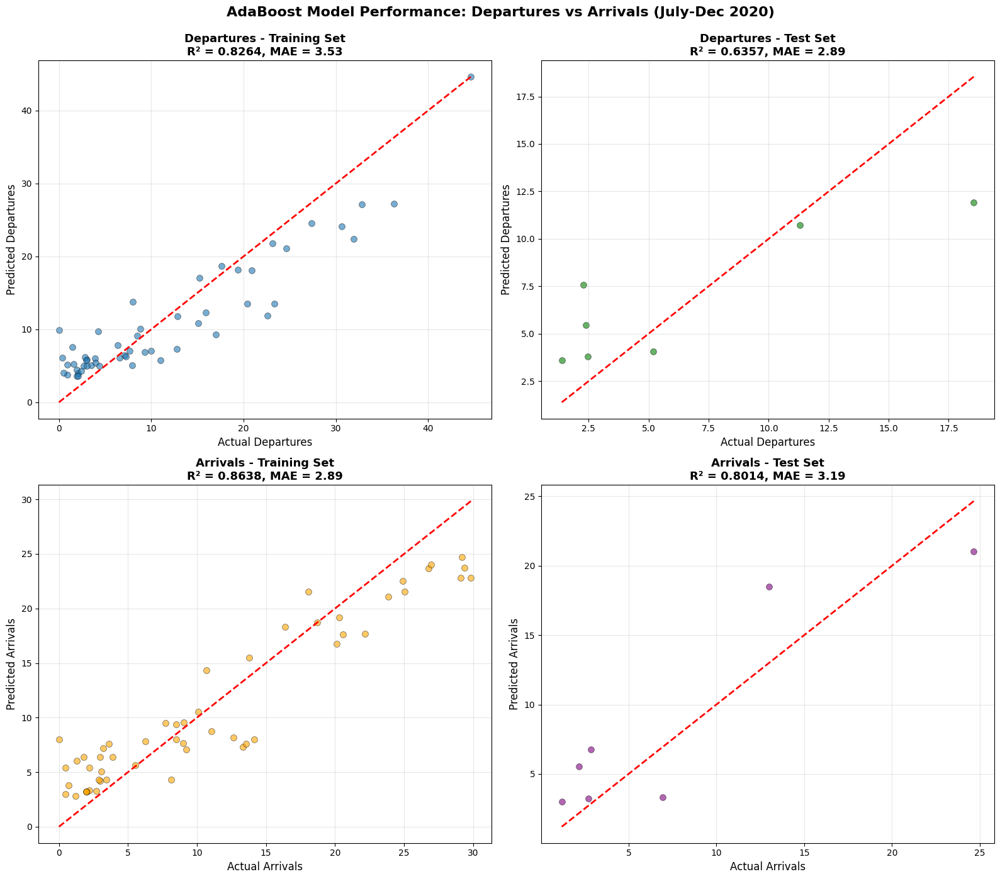


✅ Visualization complete!


In [213]:
# ======================================================================
# VISUALIZE COMPARISON: DEPARTURES VS ARRIVALS PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING ARRIVALS AND DEPARTURES PREDICTIONS")
print("="*80)

# Create comparison figure
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle('AdaBoost Model Performance: Departures vs Arrivals (July-Dec 2020)', 
             fontsize=16, fontweight='bold', y=0.995)

# ===== DEPARTURES =====
# Training set - Departures
axes[0, 0].scatter(y_train_dep, y_train_pred_dep, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0, 0].plot([y_train_dep.min(), y_train_dep.max()], 
                [y_train_dep.min(), y_train_dep.max()], 'r--', lw=2)
axes[0, 0].set_xlabel('Actual Departures', fontsize=12)
axes[0, 0].set_ylabel('Predicted Departures', fontsize=12)
axes[0, 0].set_title(f'Departures - Training Set\nR² = {r2_score(y_train_dep, y_train_pred_dep):.4f}, MAE = {mean_absolute_error(y_train_dep, y_train_pred_dep):.2f}', 
                     fontsize=13, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)

# Test set - Departures
axes[0, 1].scatter(y_test_dep, y_test_pred_dep, alpha=0.6, s=50, color='green', edgecolors='black', linewidth=0.5)
axes[0, 1].plot([y_test_dep.min(), y_test_dep.max()], 
                [y_test_dep.min(), y_test_dep.max()], 'r--', lw=2)
axes[0, 1].set_xlabel('Actual Departures', fontsize=12)
axes[0, 1].set_ylabel('Predicted Departures', fontsize=12)
axes[0, 1].set_title(f'Departures - Test Set\nR² = {r2_score(y_test_dep, y_test_pred_dep):.4f}, MAE = {mean_absolute_error(y_test_dep, y_test_pred_dep):.2f}', 
                     fontsize=13, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)

# ===== ARRIVALS =====
# Training set - Arrivals
axes[1, 0].scatter(y_train_arr, y_train_pred_arr, alpha=0.6, s=50, color='orange', edgecolors='black', linewidth=0.5)
axes[1, 0].plot([y_train_arr.min(), y_train_arr.max()], 
                [y_train_arr.min(), y_train_arr.max()], 'r--', lw=2)
axes[1, 0].set_xlabel('Actual Arrivals', fontsize=12)
axes[1, 0].set_ylabel('Predicted Arrivals', fontsize=12)
axes[1, 0].set_title(f'Arrivals - Training Set\nR² = {r2_score(y_train_arr, y_train_pred_arr):.4f}, MAE = {mean_absolute_error(y_train_arr, y_train_pred_arr):.2f}', 
                     fontsize=13, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)

# Test set - Arrivals
axes[1, 1].scatter(y_test_arr, y_test_pred_arr, alpha=0.6, s=50, color='purple', edgecolors='black', linewidth=0.5)
axes[1, 1].plot([y_test_arr.min(), y_test_arr.max()], 
                [y_test_arr.min(), y_test_arr.max()], 'r--', lw=2)
axes[1, 1].set_xlabel('Actual Arrivals', fontsize=12)
axes[1, 1].set_ylabel('Predicted Arrivals', fontsize=12)
axes[1, 1].set_title(f'Arrivals - Test Set\nR² = {r2_score(y_test_arr, y_test_pred_arr):.4f}, MAE = {mean_absolute_error(y_test_arr, y_test_pred_arr):.2f}', 
                     fontsize=13, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [214]:
# ======================================================================
# DETAILED PREDICTED VS ACTUAL VALUES - TEST SET
# ======================================================================

print("="*100)
print("DETAILED COMPARISON: PREDICTED VS ACTUAL VALUES (TEST SET)")
print("="*100)

# Get the actual zone IDs from the test set
test_zone_ids = y_test_dep.index.tolist()

# Create comprehensive comparison dataframe
detailed_comparison = pd.DataFrame({
    'Zone_ID': test_zone_ids,
    'Zone_Index': range(len(y_test_dep)),
    'Actual_Departures': y_test_dep.values,
    'Predicted_Departures': y_test_pred_dep,
    'Departure_Error': y_test_dep.values - y_test_pred_dep,
    'Departure_Error_Pct': ((y_test_dep.values - y_test_pred_dep) / y_test_dep.values * 100),
    'Actual_Arrivals': y_test_arr.values,
    'Predicted_Arrivals': y_test_pred_arr,
    'Arrival_Error': y_test_arr.values - y_test_pred_arr,
    'Arrival_Error_Pct': ((y_test_arr.values - y_test_pred_arr) / y_test_arr.values * 100),
    'Total_Actual': y_test_dep.values + y_test_arr.values,
    'Total_Predicted': y_test_pred_dep + y_test_pred_arr
})

# Round for better readability
detailed_comparison['Predicted_Departures'] = detailed_comparison['Predicted_Departures'].round(0).astype(int)
detailed_comparison['Departure_Error'] = detailed_comparison['Departure_Error'].round(0).astype(int)
detailed_comparison['Departure_Error_Pct'] = detailed_comparison['Departure_Error_Pct'].round(2)
detailed_comparison['Predicted_Arrivals'] = detailed_comparison['Predicted_Arrivals'].round(0).astype(int)
detailed_comparison['Arrival_Error'] = detailed_comparison['Arrival_Error'].round(0).astype(int)
detailed_comparison['Arrival_Error_Pct'] = detailed_comparison['Arrival_Error_Pct'].round(2)
detailed_comparison['Total_Predicted'] = detailed_comparison['Total_Predicted'].round(0).astype(int)

print("\n📊 DEPARTURES MODEL - ALL TEST ZONES:")
print("-"*100)
departures_view = detailed_comparison[['Zone_ID', 'Zone_Index', 'Actual_Departures', 'Predicted_Departures', 
                                        'Departure_Error', 'Departure_Error_Pct']].copy()
print(departures_view.to_string(index=False))

print("\n\n📊 ARRIVALS MODEL - ALL TEST ZONES:")
print("-"*100)
arrivals_view = detailed_comparison[['Zone_ID', 'Zone_Index', 'Actual_Arrivals', 'Predicted_Arrivals', 
                                      'Arrival_Error', 'Arrival_Error_Pct']].copy()
print(arrivals_view.to_string(index=False))

print("\n\n📊 COMBINED VIEW - ALL TEST ZONES:")
print("-"*100)
combined_view = detailed_comparison[['Zone_ID', 'Zone_Index', 'Actual_Departures', 'Predicted_Departures', 
                                      'Actual_Arrivals', 'Predicted_Arrivals', 
                                      'Total_Actual', 'Total_Predicted']].copy()
print(combined_view.to_string(index=False))

print("\n\n" + "="*100)
print("SUMMARY STATISTICS")
print("="*100)

print("\n🚴 DEPARTURES:")
print(f"  Mean Absolute Error: {abs(detailed_comparison['Departure_Error']).mean():.2f}")
print(f"  Mean Percentage Error: {detailed_comparison['Departure_Error_Pct'].mean():.2f}%")
print(f"  Median Absolute Error: {abs(detailed_comparison['Departure_Error']).median():.2f}")
print(f"  Max Overestimate: {detailed_comparison['Departure_Error'].min():.0f} ({detailed_comparison['Departure_Error_Pct'].min():.2f}%)")
print(f"  Max Underestimate: {detailed_comparison['Departure_Error'].max():.0f} ({detailed_comparison['Departure_Error_Pct'].max():.2f}%)")

print("\n🚴 ARRIVALS:")
print(f"  Mean Absolute Error: {abs(detailed_comparison['Arrival_Error']).mean():.2f}")
print(f"  Mean Percentage Error: {detailed_comparison['Arrival_Error_Pct'].mean():.2f}%")
print(f"  Median Absolute Error: {abs(detailed_comparison['Arrival_Error']).median():.2f}")
print(f"  Max Overestimate: {detailed_comparison['Arrival_Error'].min():.0f} ({detailed_comparison['Arrival_Error_Pct'].min():.2f}%)")
print(f"  Max Underestimate: {detailed_comparison['Arrival_Error'].max():.0f} ({detailed_comparison['Arrival_Error_Pct'].max():.2f}%)")

print("\n" + "="*100)

DETAILED COMPARISON: PREDICTED VS ACTUAL VALUES (TEST SET)

📊 DEPARTURES MODEL - ALL TEST ZONES:
----------------------------------------------------------------------------------------------------
 Zone_ID  Zone_Index  Actual_Departures  Predicted_Departures  Departure_Error  Departure_Error_Pct
     113           0           1.385870                     4               -2              -160.46
     186           1           5.206522                     4                1                21.76
     308           2          11.309783                    11                1                 5.04
     267           3           2.282609                     8               -5              -232.41
     229           4           2.472826                     4               -1               -54.00
     345           5          18.543478                    12                7                35.76
     282           6           2.391304                     5               -3              -127.47




In [215]:
# ======================================================================
# PREDICT ARRIVALS AND DEPARTURES FOR ALL ZONES AND EXPORT TO CSV
# ======================================================================

print("="*100)
print("GENERATING PREDICTIONS FOR ALL ZONES (July-December 2020)")
print("="*100)

# Prepare features for ALL zones (including those with zero demand)
all_zones_data = zones_2020.copy()

# Fill missing demand values with 0 for zones without any recorded demand
all_zones_data['total_departures_2020'] = all_zones_data['total_departures_2020'].fillna(0).astype(int)
all_zones_data['total_arrivals_2020'] = all_zones_data['total_arrivals_2020'].fillna(0).astype(int)
all_zones_data['actual_demand_2020'] = all_zones_data['actual_demand_2020'].fillna(0).astype(int)

# Prepare feature matrix for all zones
X_all_zones = all_zones_data[feature_cols_arr_dep].fillna(0)

print(f"\nTotal zones to predict: {len(all_zones_data)}")
print(f"  Zones with actual demand > 0: {(all_zones_data['actual_demand_2020'] > 0).sum()}")
print(f"  Zones with zero actual demand: {(all_zones_data['actual_demand_2020'] == 0).sum()}")
print(f"Features used: {feature_cols_arr_dep}")

# Make predictions using trained AdaBoost models
print("\n📊 Making predictions...")
predicted_departures_all = ada_departures.predict(X_all_zones)
predicted_arrivals_all = ada_arrivals.predict(X_all_zones)

# Create comprehensive predictions dataframe
predictions_all_zones = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data['poi_residential_count'].values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_departures_2020': all_zones_data['total_departures_2020'].values,
    'predicted_departures_2020': predicted_departures_all.round(0).astype(int),
    'departures_error': (all_zones_data['total_departures_2020'].values - predicted_departures_all).round(0).astype(int),
    'actual_arrivals_2020': all_zones_data['total_arrivals_2020'].values,
    'predicted_arrivals_2020': predicted_arrivals_all.round(0).astype(int),
    'arrivals_error': (all_zones_data['total_arrivals_2020'].values - predicted_arrivals_all).round(0).astype(int),
    'actual_total_demand': all_zones_data['actual_demand_2020'].values,
    'predicted_total_demand': (predicted_departures_all + predicted_arrivals_all).round(0).astype(int),
    'total_demand_error': (all_zones_data['actual_demand_2020'].values - (predicted_departures_all + predicted_arrivals_all)).round(0).astype(int)
})

# Sort by zone_id for better readability
predictions_all_zones = predictions_all_zones.sort_values('zone_id').reset_index(drop=True)

# Export to CSV
output_filename = f'{BASE_DIR}/zone_predictions_adaboost_jul_dec_2020_updatednov16.csv'
predictions_all_zones.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")
print(f"\n📊 Summary of predictions:")
print(f"   Total zones predicted: {len(predictions_all_zones)}")
print(f"   Total actual departures: {predictions_all_zones['actual_departures_2020'].sum():,}")
print(f"   Total predicted departures: {predictions_all_zones['predicted_departures_2020'].sum():,}")
print(f"   Total actual arrivals: {predictions_all_zones['actual_arrivals_2020'].sum():,}")
print(f"   Total predicted arrivals: {predictions_all_zones['predicted_arrivals_2020'].sum():,}")
print(f"   Total actual demand: {predictions_all_zones['actual_total_demand'].sum():,}")
print(f"   Total predicted demand: {predictions_all_zones['predicted_total_demand'].sum():,}")

# Display first 20 rows
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols_predictions = ['zone_id', 'longitude', 'latitude', 
                             'actual_departures_2020', 'predicted_departures_2020', 'departures_error',
                             'actual_arrivals_2020', 'predicted_arrivals_2020', 'arrivals_error',
                             'actual_total_demand', 'predicted_total_demand', 'total_demand_error']
print(predictions_all_zones[display_cols_predictions].head(20).to_string(index=False))

print("\n" + "="*100)
print("✅ ALL DONE! CSV file exported successfully.")
print("="*100)

GENERATING PREDICTIONS FOR ALL ZONES (July-December 2020)

Total zones to predict: 383
  Zones with actual demand > 0: 61
  Zones with zero actual demand: 322
Features used: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_predictions_adaboost_jul_dec_2020_updatednov16.csv

📊 Summary of predictions:
   Total zones predicted: 383
   Total actual departures: 121,025
   Total predicted departures: 2,618
   Total actual arrivals: 119,826
   Total predicted arrivals: 2,544
   Total actual demand: 240,851
   Total predicted demand: 5,157

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_departures_2020  predicted_departures

In [216]:
import folium
# ======================================================================
# INTERACTIVE FOLIUM MAPS OF PREDICTED DEMAND ON EDINBURGH (DAILY AVERAGE)
# ======================================================================

print("="*100)
print("CREATING INTERACTIVE MAPS OF PREDICTED DEMAND (DAILY AVERAGE)")
print("="*100)

# First, merge predictions with zones_wgs84 to get geometry
zones_pred_wgs84 = zones_wgs84[['zone_id', 'geometry']].merge(
    predictions_all_zones[['zone_id', 'predicted_departures_2020', 'predicted_arrivals_2020', 'predicted_total_demand']],
    on='zone_id',
    how='left'
)

# Fill NaN values with 0
zones_pred_wgs84['predicted_departures_2020'] = zones_pred_wgs84['predicted_departures_2020'].fillna(0)
zones_pred_wgs84['predicted_arrivals_2020'] = zones_pred_wgs84['predicted_arrivals_2020'].fillna(0)
zones_pred_wgs84['predicted_total_demand'] = zones_pred_wgs84['predicted_total_demand'].fillna(0)

# Divide predictions by 184 to get daily average
print("\n📊 Converting predictions to daily averages (dividing by 184 days)...")
zones_pred_wgs84['predicted_departures_daily'] = zones_pred_wgs84['predicted_departures_2020']
zones_pred_wgs84['predicted_arrivals_daily'] = zones_pred_wgs84['predicted_arrivals_2020']
zones_pred_wgs84['predicted_total_demand_daily'] = zones_pred_wgs84['predicted_total_demand'] 

print(f"   Total period departures: {zones_pred_wgs84['predicted_departures_2020'].sum():,.0f}")
print(f"   Daily average departures: {zones_pred_wgs84['predicted_departures_daily'].sum():,.1f}")
print(f"   Total period arrivals: {zones_pred_wgs84['predicted_arrivals_2020'].sum():,.0f}")
print(f"   Daily average arrivals: {zones_pred_wgs84['predicted_arrivals_daily'].sum():,.1f}")
print(f"   Total period demand: {zones_pred_wgs84['predicted_total_demand'].sum():,.0f}")
print(f"   Daily average demand: {zones_pred_wgs84['predicted_total_demand_daily'].sum():,.1f}")

# Function to create choropleth map with folium
def create_demand_map(gdf, column_name, map_title, colormap='YlOrRd'):
    """
    Create an interactive folium map with choropleth visualization
    """
    # Calculate center of Edinburgh
    center_lat = gdf.geometry.centroid.y.mean()
    center_lon = gdf.geometry.centroid.x.mean()
    
    # Create base map
    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=12,
        tiles='OpenStreetMap'
    )
    
    # Prepare data for choropleth
    gdf_json = gdf[['zone_id', column_name, 'geometry']].copy()
    
    # Create choropleth layer
    folium.Choropleth(
        geo_data=gdf_json.to_json(),
        name='choropleth',
        data=gdf_json,
        columns=['zone_id', column_name],
        key_on='feature.properties.zone_id',
        fill_color=colormap,
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=map_title,
        nan_fill_color='white'
    ).add_to(m)
    
    # Add tooltips for interactivity
    folium.GeoJson(
        gdf_json.to_json(),
        style_function=lambda x: {
            'fillColor': 'transparent',
            'color': 'transparent',
            'weight': 0
        },
        tooltip=folium.GeoJsonTooltip(
            fields=['zone_id', column_name],
            aliases=['Zone ID:', f'{map_title}:'],
            style='background-color: white; color: black; font-family: arial; font-size: 12px; padding: 10px;'
        )
    ).add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m

print("\n📍 Map 1: Creating Daily Average Departures Map...")
map_departures = create_demand_map(
    zones_pred_wgs84,
    'predicted_departures_daily',
    'Predicted Daily Departures',
    colormap='YlOrRd'
)

print("📍 Map 2: Creating Daily Average Arrivals Map...")
map_arrivals = create_demand_map(
    zones_pred_wgs84,
    'predicted_arrivals_daily',
    'Predicted Daily Arrivals',
    colormap='YlGnBu'
)

print("📍 Map 3: Creating Daily Average Total Demand Map...")
map_total = create_demand_map(
    zones_pred_wgs84,
    'predicted_total_demand_daily',
    'Predicted Daily Total Demand',
    colormap='RdPu'
)

print("\n✅ Interactive maps created successfully!")
print("\n" + "="*100)
print("DISPLAYING INTERACTIVE MAPS")
print("="*100)

# Display the maps
print("\n🗺️  MAP 1: PREDICTED DAILY DEPARTURES (July-December 2020)")
print("-" * 100)
display(map_departures)

print("\n🗺️  MAP 2: PREDICTED DAILY ARRIVALS (July-December 2020)")
print("-" * 100)
display(map_arrivals)

print("\n🗺️  MAP 3: PREDICTED DAILY TOTAL DEMAND (July-December 2020)")
print("-" * 100)
display(map_total)

print("\n" + "="*100)
print("✅ ALL INTERACTIVE MAPS DISPLAYED (DAILY AVERAGES)")
print("💡 TIP: Hover over zones to see daily average predictions")
print("📅 Note: Values are divided by 184 days (July-December 2020)")
print("="*100)

CREATING INTERACTIVE MAPS OF PREDICTED DEMAND (DAILY AVERAGE)

📊 Converting predictions to daily averages (dividing by 184 days)...
   Total period departures: 2,618
   Daily average departures: 2,618.0
   Total period arrivals: 2,544
   Daily average arrivals: 2,544.0
   Total period demand: 5,157
   Daily average demand: 5,157.0

📍 Map 1: Creating Daily Average Departures Map...
📍 Map 2: Creating Daily Average Arrivals Map...
📍 Map 3: Creating Daily Average Total Demand Map...

✅ Interactive maps created successfully!

DISPLAYING INTERACTIVE MAPS

🗺️  MAP 1: PREDICTED DAILY DEPARTURES (July-December 2020)
----------------------------------------------------------------------------------------------------


/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2774824503.py:41: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2774824503.py:42: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2774824503.py:41: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_82


🗺️  MAP 2: PREDICTED DAILY ARRIVALS (July-December 2020)
----------------------------------------------------------------------------------------------------



🗺️  MAP 3: PREDICTED DAILY TOTAL DEMAND (July-December 2020)
----------------------------------------------------------------------------------------------------



✅ ALL INTERACTIVE MAPS DISPLAYED (DAILY AVERAGES)
💡 TIP: Hover over zones to see daily average predictions
📅 Note: Values are divided by 184 days (July-December 2020)


In [218]:
# ======================================================================
# INTERACTIVE FOLIUM MAPS OF PREDICTED DEMAND (POI_SCORE > 0 ONLY)
# ======================================================================

import folium

print("="*100)
print("CREATING INTERACTIVE MAPS OF PREDICTED DEMAND (POI_SCORE > 0 ONLY)")
print("="*100)

# First, merge predictions with zones_wgs84 to get geometry AND poi_score
zones_pred_wgs84 = zones_wgs84[['zone_id', 'geometry', 'poi_score']].merge(
    predictions_all_zones[['zone_id', 'predicted_departures_2020', 'predicted_arrivals_2020', 'predicted_total_demand']],
    on='zone_id',
    how='left'
)

# Fill NaN values with 0
zones_pred_wgs84['predicted_departures_2020'] = zones_pred_wgs84['predicted_departures_2020'].fillna(0)
zones_pred_wgs84['predicted_arrivals_2020'] = zones_pred_wgs84['predicted_arrivals_2020'].fillna(0)
zones_pred_wgs84['predicted_total_demand'] = zones_pred_wgs84['predicted_total_demand'].fillna(0)
zones_pred_wgs84['poi_score'] = zones_pred_wgs84['poi_score'].fillna(0)

# *** FILTER TO ONLY ZONES WITH POI_SCORE > 0 ***
print(f"\n📊 Filtering zones...")
print(f"   Total zones before filtering: {len(zones_pred_wgs84)}")
zones_pred_wgs84_filtered = zones_pred_wgs84[zones_pred_wgs84['poi_score'] > 0].copy()
print(f"   Zones with POI score > 0: {len(zones_pred_wgs84_filtered)}")
print(f"   Zones filtered out: {len(zones_pred_wgs84) - len(zones_pred_wgs84_filtered)}")

# Divide predictions by 184 to get daily average
print("\n📊 Converting predictions to daily averages (dividing by 184 days)...")
zones_pred_wgs84_filtered['predicted_departures_daily'] = zones_pred_wgs84_filtered['predicted_departures_2020']
zones_pred_wgs84_filtered['predicted_arrivals_daily'] = zones_pred_wgs84_filtered['predicted_arrivals_2020']
zones_pred_wgs84_filtered['predicted_total_demand_daily'] = zones_pred_wgs84_filtered['predicted_total_demand']

print(f"   Total period departures (POI > 0): {zones_pred_wgs84_filtered['predicted_departures_2020'].sum():,.0f}")
print(f"   Daily average departures (POI > 0): {zones_pred_wgs84_filtered['predicted_departures_daily'].sum():,.1f}")
print(f"   Total period arrivals (POI > 0): {zones_pred_wgs84_filtered['predicted_arrivals_2020'].sum():,.0f}")
print(f"   Daily average arrivals (POI > 0): {zones_pred_wgs84_filtered['predicted_arrivals_daily'].sum():,.1f}")
print(f"   Total period demand (POI > 0): {zones_pred_wgs84_filtered['predicted_total_demand'].sum():,.0f}")
print(f"   Daily average demand (POI > 0): {zones_pred_wgs84_filtered['predicted_total_demand_daily'].sum():,.1f}")

# Function to create choropleth map with folium
def create_demand_map(gdf, column_name, map_title, colormap='YlOrRd'):
    """
    Create an interactive folium map with choropleth visualization
    """
    # Calculate center of Edinburgh
    center_lat = gdf.geometry.centroid.y.mean()
    center_lon = gdf.geometry.centroid.x.mean()
    
    # Create base map
    m = folium.Map(
        location=[center_lat, center_lon],
        zoom_start=12,
        tiles='OpenStreetMap'
    )
    
    # Prepare data for choropleth
    gdf_json = gdf[['zone_id', column_name, 'poi_score', 'geometry']].copy()
    
    # Create choropleth layer
    folium.Choropleth(
        geo_data=gdf_json.to_json(),
        name='choropleth',
        data=gdf_json,
        columns=['zone_id', column_name],
        key_on='feature.properties.zone_id',
        fill_color=colormap,
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=map_title,
        nan_fill_color='white'
    ).add_to(m)
    
    # Add tooltips for interactivity
    folium.GeoJson(
        gdf_json.to_json(),
        style_function=lambda x: {
            'fillColor': 'transparent',
            'color': 'transparent',
            'weight': 0
        },
        tooltip=folium.GeoJsonTooltip(
            fields=['zone_id', column_name, 'poi_score'],
            aliases=['Zone ID:', f'{map_title}:', 'POI Score:'],
            style='background-color: white; color: black; font-family: arial; font-size: 12px; padding: 10px;'
        )
    ).add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m

print("\n📍 Map 1: Creating Daily Average Departures Map (POI > 0)...")
map_departures = create_demand_map(
    zones_pred_wgs84_filtered,
    'predicted_departures_daily',
    'Predicted Daily Departures',
    colormap='YlOrRd'
)

print("📍 Map 2: Creating Daily Average Arrivals Map (POI > 0)...")
map_arrivals = create_demand_map(
    zones_pred_wgs84_filtered,
    'predicted_arrivals_daily',
    'Predicted Daily Arrivals',
    colormap='YlGnBu'
)

print("📍 Map 3: Creating Daily Average Total Demand Map (POI > 0)...")
map_total = create_demand_map(
    zones_pred_wgs84_filtered,
    'predicted_total_demand_daily',
    'Predicted Daily Total Demand',
    colormap='RdPu'
)

print("\n✅ Interactive maps created successfully!")
print("\n" + "="*100)
print("DISPLAYING INTERACTIVE MAPS (POI_SCORE > 0 ONLY)")
print("="*100)

# Display the maps
print("\n🗺️  MAP 1: PREDICTED DAILY DEPARTURES (POI Score > 0)")
print("-" * 100)
display(map_departures)

print("\n🗺️  MAP 2: PREDICTED DAILY ARRIVALS (POI Score > 0)")
print("-" * 100)
display(map_arrivals)

print("\n🗺️  MAP 3: PREDICTED DAILY TOTAL DEMAND (POI Score > 0)")
print("-" * 100)
display(map_total)

print("\n" + "="*100)
print("✅ ALL INTERACTIVE MAPS DISPLAYED (POI > 0 ONLY)")
print("💡 TIP: Hover over zones to see daily predictions and POI score")
print(f"📊 Showing {len(zones_pred_wgs84_filtered)} zones with POI score > 0")
print(f"🚫 Hidden: {len(zones_pred_wgs84) - len(zones_pred_wgs84_filtered)} zones with POI = 0")
print("="*100)

CREATING INTERACTIVE MAPS OF PREDICTED DEMAND (POI_SCORE > 0 ONLY)

📊 Filtering zones...
   Total zones before filtering: 649
   Zones with POI score > 0: 383
   Zones filtered out: 266

📊 Converting predictions to daily averages (dividing by 184 days)...
   Total period departures (POI > 0): 2,618
   Daily average departures (POI > 0): 2,618.0
   Total period arrivals (POI > 0): 2,544
   Daily average arrivals (POI > 0): 2,544.0
   Total period demand (POI > 0): 5,157
   Daily average demand (POI > 0): 5,157.0

📍 Map 1: Creating Daily Average Departures Map (POI > 0)...


/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4082853111.py:50: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4082853111.py:51: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()


📍 Map 2: Creating Daily Average Arrivals Map (POI > 0)...
📍 Map 3: Creating Daily Average Total Demand Map (POI > 0)...

✅ Interactive maps created successfully!

DISPLAYING INTERACTIVE MAPS (POI_SCORE > 0 ONLY)

🗺️  MAP 1: PREDICTED DAILY DEPARTURES (POI Score > 0)
----------------------------------------------------------------------------------------------------


/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4082853111.py:50: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4082853111.py:51: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/4082853111.py:50: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_82


🗺️  MAP 2: PREDICTED DAILY ARRIVALS (POI Score > 0)
----------------------------------------------------------------------------------------------------



🗺️  MAP 3: PREDICTED DAILY TOTAL DEMAND (POI Score > 0)
----------------------------------------------------------------------------------------------------



✅ ALL INTERACTIVE MAPS DISPLAYED (POI > 0 ONLY)
💡 TIP: Hover over zones to see daily predictions and POI score
📊 Showing 383 zones with POI score > 0
🚫 Hidden: 266 zones with POI = 0


In [219]:
# ======================================================================
# EXPORT FILTERED ZONES (POI > 0) WITH PREDICTIONS TO CSV
# ======================================================================

print("="*100)
print("EXPORTING FILTERED ZONES (POI_SCORE > 0) TO CSV")
print("="*100)

# Prepare data for export - merge predictions with zones_wgs84 that have poi_score > 0
zones_export = zones_wgs84[zones_wgs84['poi_score'] > 0].copy()

# Merge with predictions
zones_export = zones_export.merge(
    predictions_all_zones[['zone_id', 'predicted_departures_2020', 'predicted_arrivals_2020', 
                           'predicted_total_demand', 'actual_departures_2020', 
                           'actual_arrivals_2020', 'actual_total_demand']],
    on='zone_id',
    how='left'
)

# Fill NaN values with 0
zones_export['predicted_departures_2020'] = zones_export['predicted_departures_2020'].fillna(0).astype(int)
zones_export['predicted_arrivals_2020'] = zones_export['predicted_arrivals_2020'].fillna(0).astype(int)
zones_export['predicted_total_demand'] = zones_export['predicted_total_demand'].fillna(0).astype(int)
zones_export['actual_departures_2020'] = zones_export['actual_departures_2020'].fillna(0).astype(int)
zones_export['actual_arrivals_2020'] = zones_export['actual_arrivals_2020'].fillna(0).astype(int)
zones_export['actual_total_demand'] = zones_export['actual_total_demand'].fillna(0).astype(int)

# Calculate daily averages
zones_export['predicted_departures_daily'] = (zones_export['predicted_departures_2020'] / 184).round(2)
zones_export['predicted_arrivals_daily'] = (zones_export['predicted_arrivals_2020'] / 184).round(2)
zones_export['predicted_total_demand_daily'] = (zones_export['predicted_total_demand'] / 184).round(2)
zones_export['actual_departures_daily'] = (zones_export['actual_departures_2020'] / 184).round(2)
zones_export['actual_arrivals_daily'] = (zones_export['actual_arrivals_2020'] / 184).round(2)
zones_export['actual_total_demand_daily'] = (zones_export['actual_total_demand'] / 184).round(2)

# Select columns for export (excluding geometry)
export_columns = [
    'zone_id', 'longitude', 'latitude', 'poi_score',
    'poi_commercial_count', 'poi_hospital_count', 'poi_library_count',
    'poi_residential_count', 'poi_school_count', 'poi_university_count',
    'population_2021', 'population_density', 'area_km2',
    'actual_departures_2020', 'predicted_departures_2020', 'predicted_departures_daily',
    'actual_arrivals_2020', 'predicted_arrivals_2020', 'predicted_arrivals_daily',
    'actual_total_demand', 'predicted_total_demand', 'predicted_total_demand_daily'
]

# Check if age columns exist and add them
age_cols_available = [col for col in zones_export.columns if col.startswith('age_') or col == 'total_age_population']
if age_cols_available:
    export_columns = export_columns[:13] + age_cols_available + export_columns[13:]
    print(f"\n✓ Including {len(age_cols_available)} age-related columns")

# Filter columns that exist in the dataframe
export_columns_filtered = [col for col in export_columns if col in zones_export.columns]

# Create export dataframe (drop geometry column)
zones_export_df = zones_export[export_columns_filtered].copy()

# Sort by zone_id
zones_export_df = zones_export_df.sort_values('zone_id').reset_index(drop=True)

# Export to CSV
output_filename = f'{BASE_DIR}/zone_predictions_filtered_poi_0.csv'
zones_export_df.to_csv(output_filename, index=False)

print(f"\n✅ Export complete!")
print(f"📁 File saved to: {output_filename}")
print(f"\n📊 Export Summary:")
print(f"   Total zones exported: {len(zones_export_df)}")
print(f"   Columns exported: {len(export_columns_filtered)}")
print(f"   Zones filtered out (POI = 0): {len(zones_wgs84) - len(zones_export_df)}")
print(f"\n📈 Data Summary:")
print(f"   Total predicted departures (period): {zones_export_df['predicted_departures_2020'].sum():,}")
print(f"   Total predicted arrivals (period): {zones_export_df['predicted_arrivals_2020'].sum():,}")
print(f"   Total predicted demand (period): {zones_export_df['predicted_total_demand'].sum():,}")
print(f"   Average daily departures: {zones_export_df['predicted_departures_daily'].sum():,.2f}")
print(f"   Average daily arrivals: {zones_export_df['predicted_arrivals_daily'].sum():,.2f}")
print(f"   Average daily total demand: {zones_export_df['predicted_total_demand_daily'].sum():,.2f}")

# Display first 10 rows
print("\n" + "="*100)
print("SAMPLE OF EXPORTED DATA (First 10 rows)")
print("="*100)
display_cols = ['zone_id', 'longitude', 'latitude', 'poi_score',
                'predicted_departures_daily', 'predicted_arrivals_daily', 
                'predicted_total_demand_daily', 'population_density']
print(zones_export_df[display_cols].head(10).to_string(index=False))

print("\n" + "="*100)
print("✅ CSV FILE EXPORTED SUCCESSFULLY!")
print("="*100)

EXPORTING FILTERED ZONES (POI_SCORE > 0) TO CSV

✅ Export complete!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_predictions_filtered_poi_0.csv

📊 Export Summary:
   Total zones exported: 383
   Columns exported: 22
   Zones filtered out (POI = 0): 266

📈 Data Summary:
   Total predicted departures (period): 2,618
   Total predicted arrivals (period): 2,544
   Total predicted demand (period): 5,157
   Average daily departures: 13.90
   Average daily arrivals: 13.93
   Average daily total demand: 28.07

SAMPLE OF EXPORTED DATA (First 10 rows)
 zone_id  longitude  latitude  poi_score  predicted_departures_daily  predicted_arrivals_daily  predicted_total_demand_daily  population_density
      29  -3.203014 55.863763        1.5                        0.03                      0.03                          0.06          184.832482
      30  -3.191947 55.863871     

# Morning Departure Prediction

In [230]:
# ======================================================================
# MORNING DEPARTURE AGGREGATION (STATION → ZONE)
# ======================================================================

print("="*100)
print("VERIFICATION: MORNING DEPARTURE AGGREGATION FROM STATIONS TO ZONES")
print("="*100)

# ---- Step 1: Check the morning_counts.csv structure ----
MORNING_FP = f"{BASE_DIR}/morning_counts.csv"
morning_raw = pd.read_csv(MORNING_FP)

print("\n📂 STEP 1: Morning Counts File Structure")
print(f"   File: {MORNING_FP}")
print(f"   Total rows (stations): {len(morning_raw)}")
print(f"   Columns: {list(morning_raw.columns)}")
print(f"\n   First 10 rows:")
print(morning_raw.head(10).to_string(index=False))

# ---- Step 2: Check station→zone mapping ----
print("\n\n📍 STEP 2: Station→Zone Mapping")
print(f"   Total stations in mapping: {len(existing_station_ids)}")
print(f"   Unique stations: {existing_station_ids['station_id'].nunique()}")
print(f"   Unique zones: {existing_station_ids['zone_id'].nunique()}")

# ---- Step 3: Merge morning data with zones ----
morning_raw['station_id'] = pd.to_numeric(morning_raw['station_id'], errors='coerce').astype('Int64')
morning_raw = morning_raw.dropna(subset=['station_id'])

station_zone_map = existing_station_ids.drop_duplicates('station_id')
morning_with_zone = morning_raw.merge(station_zone_map, on='station_id', how='left')

print(f"\n\n🔗 STEP 3: Merge Results")
print(f"   Stations with zone assigned: {morning_with_zone['zone_id'].notna().sum()}")
print(f"   Stations WITHOUT zone: {morning_with_zone['zone_id'].isna().sum()}")

if morning_with_zone['zone_id'].isna().any():
    unmapped_stations = morning_with_zone[morning_with_zone['zone_id'].isna()]['station_id'].tolist()
    print(f"   ⚠️  Unmapped station IDs: {unmapped_stations}")

# ---- Step 4: Identify departure columns ----
morning_cols = [c for c in morning_raw.columns if c != 'station_id']
candidate_dep = [c for c in morning_cols if 'dep' in c.lower()]

print(f"\n\n📊 STEP 4: Departure Column Detection")
print(f"   All morning columns: {morning_cols}")
print(f"   Detected departure columns: {candidate_dep}")

if not candidate_dep:
    print(f"   ❌ ERROR: No departure columns detected!")
    print(f"   Column names must contain 'dep' (case-insensitive)")
else:
    print(f"   ✅ Found {len(candidate_dep)} departure column(s)")

# ---- Step 5: Aggregate by zone ----
morning_with_zone_clean = morning_with_zone.dropna(subset=['zone_id']).copy()
morning_with_zone_clean['zone_id'] = morning_with_zone_clean['zone_id'].astype(int)

# Aggregate each morning column separately
agg_dict = {c: 'sum' for c in morning_cols}
zone_morning_check = morning_with_zone_clean.groupby('zone_id').agg(agg_dict).reset_index()

# Create morning_departures_total
if candidate_dep:
    zone_morning_check['morning_departures_total'] = zone_morning_check[candidate_dep].sum(axis=1)
else:
    print(f"\n   ⚠️  WARNING: Cannot create morning_departures_total (no departure columns)")

print(f"\n\n🎯 STEP 5: Zone-Level Aggregation Results")
print(f"   Total zones with morning data: {len(zone_morning_check)}")

if 'morning_departures_total' in zone_morning_check.columns:
    print(f"   Total morning departures (all zones): {zone_morning_check['morning_departures_total'].sum():,}")
    print(f"   Zones with departures > 0: {(zone_morning_check['morning_departures_total'] > 0).sum()}")
    print(f"   Average departures per zone: {zone_morning_check['morning_departures_total'].mean():.2f}")
    print(f"   Max departures (single zone): {zone_morning_check['morning_departures_total'].max():,}")
    
    print(f"\n   📈 Top 10 Zones by Morning Departures:")
    top10_zones = zone_morning_check.nlargest(10, 'morning_departures_total')[
        ['zone_id', 'morning_departures_total'] + candidate_dep
    ]
    print(top10_zones.to_string(index=False))
else:
    print(f"   ⚠️  morning_departures_total column NOT created")

# ---- Step 6: Compare with existing zones_2020 ----
print(f"\n\n🔍 STEP 6: Compare with zones_2020 DataFrame")

if 'morning_departures_total' in zones_2020.columns:
    existing_total = zones_2020['morning_departures_total'].sum()
    new_total = zone_morning_check['morning_departures_total'].sum() if 'morning_departures_total' in zone_morning_check.columns else 0
    
    print(f"   Morning departures in zones_2020: {existing_total:,}")
    print(f"   Morning departures in new check: {new_total:,}")
    print(f"   Difference: {abs(existing_total - new_total):,}")
    
    if existing_total == new_total:
        print(f"   ✅ VERIFIED: Aggregation is CORRECT!")
    else:
        print(f"   ⚠️  WARNING: Totals don't match - check aggregation logic")
else:
    print(f"   ⚠️  'morning_departures_total' not found in zones_2020")

# ---- Step 7: Detailed Example ----
print(f"\n\n🔬 STEP 7: Detailed Example - Zone with Most Departures")

if 'morning_departures_total' in zone_morning_check.columns:
    top_zone_id = zone_morning_check.loc[zone_morning_check['morning_departures_total'].idxmax(), 'zone_id']
    
    # Get all stations in this zone
    stations_in_top_zone = morning_with_zone_clean[morning_with_zone_clean['zone_id'] == top_zone_id]
    
    print(f"   Zone ID: {top_zone_id}")
    print(f"   Total morning departures: {zone_morning_check[zone_morning_check['zone_id'] == top_zone_id]['morning_departures_total'].values[0]:,}")
    print(f"   Number of stations in zone: {len(stations_in_top_zone)}")
    print(f"\n   Stations contributing to this zone:")
    print(stations_in_top_zone[['station_id', 'zone_id'] + candidate_dep].to_string(index=False))

print("\n" + "="*100)
print("✅ VERIFICATION COMPLETE!")
print("="*100)

VERIFICATION: MORNING DEPARTURE AGGREGATION FROM STATIONS TO ZONES

📂 STEP 1: Morning Counts File Structure
   File: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/morning_counts.csv
   Total rows (stations): 112
   Columns: ['station_id', 'departure_count', 'arrival_count']

   First 10 rows:
 station_id  departure_count  arrival_count
        171         0.625000       0.994565
        183         1.777174       2.820652
        189         0.711957       0.902174
        225         0.184783       0.434783
        246         1.619565       0.929348
        247         1.059783       1.548913
        248         1.440217       0.891304
        249         1.913043       0.913043
        250         2.445652       2.652174
        251         0.065217       0.119565


📍 STEP 2: Station→Zone Mapping
   Total stations in mapping: 102
   Unique stations: 102
   Unique zones: 64


🔗 ST

In [231]:
# ======================================================================
# LOAD MORNING DATA AND MERGE WITH ZONES_2020
# ======================================================================

print("="*100)
print("LOADING MORNING DATA FROM CSV")
print("="*100)

# Load morning counts
MORNING_FP = f"{BASE_DIR}/morning_counts.csv"
morning_raw = pd.read_csv(MORNING_FP)

print(f"\n📂 Morning data file: {MORNING_FP}")
print(f"   Total stations: {len(morning_raw)}")
print(f"   Columns: {list(morning_raw.columns)}")

# Ensure station_id is numeric
morning_raw['station_id'] = pd.to_numeric(morning_raw['station_id'], errors='coerce').astype('Int64')
morning_raw = morning_raw.dropna(subset=['station_id'])

# Merge with station-to-zone mapping
station_zone_map = existing_station_ids.drop_duplicates('station_id')
morning_with_zone = morning_raw.merge(station_zone_map, on='station_id', how='left')

print(f"\n🔗 Merge results:")
print(f"   Stations with zone: {morning_with_zone['zone_id'].notna().sum()}")
print(f"   Stations without zone: {morning_with_zone['zone_id'].isna().sum()}")

# Remove unmapped stations
morning_with_zone_clean = morning_with_zone.dropna(subset=['zone_id']).copy()
morning_with_zone_clean['zone_id'] = morning_with_zone_clean['zone_id'].astype(int)

# Identify departure and arrival columns
morning_cols = [c for c in morning_raw.columns if c != 'station_id']
departure_cols = [c for c in morning_cols if 'dep' in c.lower()]
arrival_cols = [c for c in morning_cols if 'arr' in c.lower()]

print(f"\n📊 Column detection:")
print(f"   Departure columns: {departure_cols}")
print(f"   Arrival columns: {arrival_cols}")

# Aggregate by zone
agg_dict = {c: 'sum' for c in morning_cols}
zone_morning = morning_with_zone_clean.groupby('zone_id').agg(agg_dict).reset_index()

# Create total columns (DAILY COUNTS - already in the CSV)
if departure_cols:
    zone_morning['morning_departures_total'] = zone_morning[departure_cols].sum(axis=1)
else:
    print("⚠️  WARNING: No departure columns found")
    zone_morning['morning_departures_total'] = 0

if arrival_cols:
    zone_morning['morning_arrivals_total'] = zone_morning[arrival_cols].sum(axis=1)
else:
    print("⚠️  WARNING: No arrival columns found")
    zone_morning['morning_arrivals_total'] = 0

zone_morning['morning_departures_total'] *= 184
zone_morning['morning_arrivals_total'] *= 184
zone_morning['morning_total'] = zone_morning['morning_departures_total'] + zone_morning['morning_arrivals_total']

print(zone_morning)
print(f"\n📈 Aggregation results:")
print(f"   Zones with morning data: {len(zone_morning)}")
print(f"   Total morning departures: {zone_morning['morning_departures_total'].sum():,.0f}")
print(f"   Total morning arrivals: {zone_morning['morning_arrivals_total'].sum():,.0f}")
print(f"   Total morning activity: {zone_morning['morning_total'].sum():,.0f}")

# After building zone_morning:

zones_2020 = zones_2020.merge(
    zone_morning[['zone_id','morning_departures_total','morning_arrivals_total','morning_total']],
    on='zone_id', how='left'
).fillna({'morning_departures_total':0,'morning_arrivals_total':0,'morning_total':0})

# Ensure counts are daily (remove prior *184 if applied)
# If you already multiplied, undo:
zones_2020['morning_departures_total'] /= 184
zones_2020['morning_arrivals_total']   /= 184
zones_2020['morning_total']            = zones_2020['morning_departures_total'] + zones_2020['morning_arrivals_total']

# Prep target
zones_for_morning_model = zones_2020[zones_2020['morning_total'] > 0].copy()
zones_for_morning_model['morning_departures_daily'] = zones_for_morning_model['morning_departures_total']


# Fill NaN with 0
#zones_2020['morning_departures_total'] = zones_2020['morning_departures_total'].fillna(0).astype(int)
#zones_2020['morning_arrivals_total'] = zones_2020['morning_arrivals_total'].fillna(0).astype(int)
#zones_2020['morning_total'] = zones_2020['morning_total'].fillna(0).astype(int)

#print(f"\n✅ Morning data merged with zones_2020!")
#print(f"   Zones with morning activity > 0: {(zones_2020['morning_total'] > 0).sum()}")
#print(f"   Zones with zero morning activity: {(zones_2020['morning_total'] == 0).sum()}")

print("\n" + "="*100)
print("✅ MORNING DATA LOADED SUCCESSFULLY!")
print("="*100)

LOADING MORNING DATA FROM CSV

📂 Morning data file: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/morning_counts.csv
   Total stations: 112
   Columns: ['station_id', 'departure_count', 'arrival_count']

🔗 Merge results:
   Stations with zone: 102
   Stations without zone: 10

📊 Column detection:
   Departure columns: ['departure_count']
   Arrival columns: ['arrival_count']
    zone_id  departure_count  arrival_count  morning_departures_total  \
0       271         0.168478       0.081522                      31.0   
1       272         0.320652       0.554348                      59.0   
2       317         0.326087       1.086957                      60.0   
3       342         1.668478       4.690217                     307.0   
4       359         0.184783       0.320652                      34.0   
..      ...              ...            ...                       ...   
59    

In [232]:
# ======================================================================
# PREPARE DATA FOR MORNING DEPARTURES PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR MORNING DEPARTURES PREDICTION")
print("="*80)

# Check if morning data is available
if 'morning_total' not in zones_2020.columns:
    print("❌ ERROR: Morning data not found. Please run the morning data loading cell first.")
else:
    # Filter to zones with morning activity
    zones_for_morning_model = zones_2020[zones_2020['morning_total'] > 0].copy()
    
    print(f"\nZones with morning demand: {len(zones_for_morning_model)}")
    
    # Morning departures are already in daily counts (no need to divide by 184)
    if 'morning_departures_total' in zones_for_morning_model.columns:
        zones_for_morning_model['morning_departures_daily'] = zones_for_morning_model['morning_departures_total']
    
    print(f"\n⚠️  NOTE: Morning data is ALREADY in daily counts (not period totals)")
    print(f"\nTarget variable statistics:")
    print(f"  Morning Departures Daily - Mean: {zones_for_morning_model['morning_departures_daily'].mean():.2f}")
    print(f"  Morning Departures Daily - Std: {zones_for_morning_model['morning_departures_daily'].std():.2f}")
    
    # Use same features as before
    feature_cols_morning = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                            'poi_library_count', 'poi_school_count', 
                            'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_morning}")
    
    # Prepare features and target
    X_morning = zones_for_morning_model[feature_cols_morning].fillna(0)
    y_morning_dep = zones_for_morning_model['morning_departures_daily']
    
    print(f"\nFeature matrix shape: {X_morning.shape}")
    print(f"Target shape: {y_morning_dep.shape}")
    
    # Split data
    X_train_morning, X_test_morning, y_train_morning, y_test_morning = train_test_split(
        X_morning, y_morning_dep, test_size=0.1, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_morning)}")
    print(f"Test set size: {len(X_test_morning)}")
    print("="*80)

PREPARING DATA FOR MORNING DEPARTURES PREDICTION

Zones with morning demand: 61

⚠️  NOTE: Morning data is ALREADY in daily counts (not period totals)

Target variable statistics:
  Morning Departures Daily - Mean: 1.72
  Morning Departures Daily - Std: 1.64

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (61, 8)
Target shape: (61,)

Train set size: 54
Test set size: 7


In [233]:
# ======================================================================
# TRAIN ADABOOST FOR MORNING DEPARTURES PREDICTION
# ======================================================================

print("="*80)
print("TRAINING ADABOOST MODEL FOR MORNING DEPARTURES PREDICTION")
print("="*80)

# Preconditions
assert 'X_train_morning' in globals() and 'X_test_morning' in globals(), "Train/test feature sets missing."
assert 'y_train_morning' in globals() and 'y_test_morning' in globals(), "Train/test targets missing."
assert X_train_morning.shape[0] == y_train_morning.shape[0], "Train feature/target length mismatch."
assert X_test_morning.shape[0] == y_test_morning.shape[0], "Test feature/target length mismatch."
assert X_test_morning.shape[0] > 1, "Test set too small for R²."

# Train AdaBoost
ada_morning_departures = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_morning_departures.fit(X_train_morning, y_train_morning)

# Make predictions
y_train_pred_morning = ada_morning_departures.predict(X_train_morning)
y_test_pred_morning = ada_morning_departures.predict(X_test_morning)

# Evaluate model
print("\n📊 MORNING DEPARTURES MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_morning, y_train_pred_morning):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_morning, y_train_pred_morning)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_morning, y_train_pred_morning):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_morning, y_test_pred_morning):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_morning, y_test_pred_morning)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_morning, y_test_pred_morning):.2f}")

# Feature importance
print("\n🎯 Feature Importance (Morning Departures):")
print("-" * 80)
importance_df_morning = pd.DataFrame({
    'Feature': feature_cols_morning,
    'Importance': ada_morning_departures.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_morning.to_string(index=False))

# Sample predictions
print("\n📈 Sample Predictions vs Actual (Test Set - Morning Departures):")
print("-" * 80)
comparison_morning = pd.DataFrame({
    'Actual_Morning_Departures': y_test_morning.values[:15],
    'Predicted_Morning_Departures': y_test_pred_morning[:15],
    'Error': y_test_morning.values[:15] - y_test_pred_morning[:15]
})
print(comparison_morning.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR MORNING DEPARTURES PREDICTION

📊 MORNING DEPARTURES MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8837
  RMSE: 0.56
  MAE: 0.43

Test Performance:
  R² Score: 0.6556
  RMSE: 0.77
  MAE: 0.55

🎯 Feature Importance (Morning Departures):
--------------------------------------------------------------------------------
             Feature  Importance
  population_density    0.544646
           longitude    0.159322
poi_commercial_count    0.096713
            latitude    0.075429
   poi_library_count    0.072681
poi_university_count    0.039129
    poi_school_count    0.009346
  poi_hospital_count    0.002735

📈 Sample Predictions vs Actual (Test Set - Morning Departures):
--------------------------------------------------------------------------------
 Actual_Morning_Departures  Predicted_Morning_Departures     Error
                  0.168478                      0.40489

VISUALIZING MORNING DEPARTURES PREDICTIONS


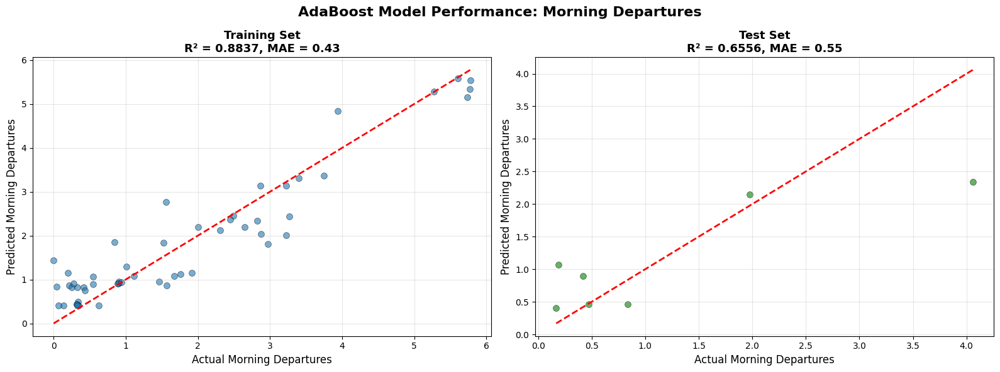


✅ Visualization complete!


In [234]:
# ======================================================================
# VISUALIZE MORNING DEPARTURES PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING MORNING DEPARTURES PREDICTIONS")
print("="*80)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('AdaBoost Model Performance: Morning Departures', 
             fontsize=16, fontweight='bold')

# Training set
axes[0].scatter(y_train_morning, y_train_pred_morning, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0].plot([y_train_morning.min(), y_train_morning.max()], 
            [y_train_morning.min(), y_train_morning.max()], 'r--', lw=2)
axes[0].set_xlabel('Actual Morning Departures', fontsize=12)
axes[0].set_ylabel('Predicted Morning Departures', fontsize=12)
axes[0].set_title(f'Training Set\nR² = {r2_score(y_train_morning, y_train_pred_morning):.4f}, MAE = {mean_absolute_error(y_train_morning, y_train_pred_morning):.2f}', 
                 fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Test set
axes[1].scatter(y_test_morning, y_test_pred_morning, alpha=0.6, s=50, color='green', edgecolors='black', linewidth=0.5)
axes[1].plot([y_test_morning.min(), y_test_morning.max()], 
            [y_test_morning.min(), y_test_morning.max()], 'r--', lw=2)
axes[1].set_xlabel('Actual Morning Departures', fontsize=12)
axes[1].set_ylabel('Predicted Morning Departures', fontsize=12)
axes[1].set_title(f'Test Set\nR² = {r2_score(y_test_morning, y_test_pred_morning):.4f}, MAE = {mean_absolute_error(y_test_morning, y_test_pred_morning):.2f}', 
                 fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [235]:
# ======================================================================
# PREDICT MORNING DEPARTURES FOR ALL ZONES AND EXPORT TO CSV (DAILY ONLY)
# ======================================================================

print("="*100)
print("GENERATING MORNING DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)")
print("="*100)

# Prepare features for ALL zones (including those with zero morning demand)
all_zones_data = zones_2020.copy()

# Fill missing values with 0
if 'morning_departures_total' not in all_zones_data.columns:
    all_zones_data['morning_departures_total'] = 0
if 'morning_total' not in all_zones_data.columns:
    all_zones_data['morning_total'] = 0

all_zones_data['morning_departures_total'] = all_zones_data['morning_departures_total'].fillna(0).astype(int)
all_zones_data['morning_total'] = all_zones_data['morning_total'].fillna(0).astype(int)

# Calculate actual daily departures (already in daily format from CSV)
all_zones_data['actual_morning_departures_daily'] = all_zones_data['morning_departures_total']

# Prepare feature matrix for all zones
X_all_zones_morning = all_zones_data[feature_cols_morning].fillna(0)

print(f"\nTotal zones to predict: {len(all_zones_data)}")
print(f"  Zones with actual morning activity > 0: {(all_zones_data['morning_total'] > 0).sum()}")
print(f"  Zones with zero morning activity: {(all_zones_data['morning_total'] == 0).sum()}")
print(f"Features used: {feature_cols_morning}")

# Make predictions using trained AdaBoost model
print("\n📊 Making predictions...")
predicted_morning_departures_daily = ada_morning_departures.predict(X_all_zones_morning)

# Create comprehensive predictions dataframe (DAILY ONLY)
predictions_morning_all_zones = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data.get('poi_residential_count', pd.Series([0]*len(all_zones_data))).values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_morning_departures_daily': all_zones_data['actual_morning_departures_daily'].values.round(2),
    'predicted_morning_departures_daily': predicted_morning_departures_daily.round(2),
    'departures_error_daily': (all_zones_data['actual_morning_departures_daily'].values - predicted_morning_departures_daily).round(2)
})

# Sort by zone_id for better readability
predictions_morning_all_zones = predictions_morning_all_zones.sort_values('zone_id').reset_index(drop=True)

# Export to CSV
output_filename = f'{BASE_DIR}/zone_morning_departures_predictions_daily.csv'
predictions_morning_all_zones.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")
print(f"\n📊 Summary of predictions (DAILY COUNTS):")
print(f"   Total zones predicted: {len(predictions_morning_all_zones)}")
print(f"   Average daily actual departures: {predictions_morning_all_zones['actual_morning_departures_daily'].sum():.2f}")
print(f"   Average daily predicted departures: {predictions_morning_all_zones['predicted_morning_departures_daily'].sum():.2f}")

# Calculate error metrics
mean_absolute_error_val = predictions_morning_all_zones['departures_error_daily'].abs().mean()
print(f"\n📈 Error Metrics (Daily):")
print(f"   Mean absolute error: {mean_absolute_error_val:.2f}")
print(f"   Mean error: {predictions_morning_all_zones['departures_error_daily'].mean():.2f}")
print(f"   Median absolute error: {predictions_morning_all_zones['departures_error_daily'].abs().median():.2f}")

# Display first 20 rows
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols_predictions = ['zone_id', 'longitude', 'latitude', 
                             'actual_morning_departures_daily', 
                             'predicted_morning_departures_daily', 
                             'departures_error_daily']
print(predictions_morning_all_zones[display_cols_predictions].head(20).to_string(index=False))

print("\n" + "="*100)
print("✅ ALL DONE! CSV file exported with DAILY counts only.")
print("="*100)

GENERATING MORNING DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)

Total zones to predict: 383
  Zones with actual morning activity > 0: 42
  Zones with zero morning activity: 341
Features used: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_morning_departures_predictions_daily.csv

📊 Summary of predictions (DAILY COUNTS):
   Total zones predicted: 383
   Average daily actual departures: 75.00
   Average daily predicted departures: 399.50

📈 Error Metrics (Daily):
   Mean absolute error: 0.87
   Mean error: -0.85
   Median absolute error: 0.84

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_morning_depart

# Morning Arrivals

In [236]:
# ======================================================================
# PREPARE DATA FOR MORNING ARRIVALS PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR MORNING ARRIVALS PREDICTION")
print("="*80)

# Check if morning data is available
if 'morning_total' not in zones_2020.columns:
    print("❌ ERROR: Morning data not found. Please run the morning data loading cell first.")
else:
    # Filter to zones with morning activity
    zones_for_morning_model = zones_2020[zones_2020['morning_total'] > 0].copy()
    
    print(f"\nZones with morning demand: {len(zones_for_morning_model)}")
    
    # Morning arrivals are already in daily counts
    if 'morning_arrivals_total' in zones_for_morning_model.columns:
        zones_for_morning_model['morning_arrivals_daily'] = zones_for_morning_model['morning_arrivals_total']
    
    print(f"\n⚠️  NOTE: Morning data is ALREADY in daily counts (not period totals)")
    print(f"\nTarget variable statistics:")
    print(f"  Morning Arrivals Daily - Mean: {zones_for_morning_model['morning_arrivals_daily'].mean():.2f}")
    print(f"  Morning Arrivals Daily - Std: {zones_for_morning_model['morning_arrivals_daily'].std():.2f}")
    
    # Use same features as morning departures
    feature_cols_morning_arr = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                                'poi_library_count', 'poi_school_count', 
                                'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_morning_arr}")
    
    # Prepare features and target
    X_morning_arr = zones_for_morning_model[feature_cols_morning_arr].fillna(0)
    y_morning_arr = zones_for_morning_model['morning_arrivals_daily']
    
    print(f"\nFeature matrix shape: {X_morning_arr.shape}")
    print(f"Target shape: {y_morning_arr.shape}")
    
    # Split data
    X_train_morning_arr, X_test_morning_arr, y_train_morning_arr, y_test_morning_arr = train_test_split(
        X_morning_arr, y_morning_arr, test_size=0.05, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_morning_arr)}")
    print(f"Test set size: {len(X_test_morning_arr)}")
    print("="*80)

PREPARING DATA FOR MORNING ARRIVALS PREDICTION

Zones with morning demand: 61

⚠️  NOTE: Morning data is ALREADY in daily counts (not period totals)

Target variable statistics:
  Morning Arrivals Daily - Mean: 1.69
  Morning Arrivals Daily - Std: 1.55

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (61, 8)
Target shape: (61,)

Train set size: 57
Test set size: 4


In [237]:
# ======================================================================
# TRAIN ADABOOST FOR MORNING ARRIVALS PREDICTION
# ======================================================================

zone_morning['morning_departures_total'] *= 184
zone_morning['morning_arrivals_total'] *= 184
zone_morning['morning_total'] = zone_morning['morning_departures_total'] + zone_morning['morning_arrivals_total']

print("="*80)
print("TRAINING ADABOOST MODEL FOR MORNING ARRIVALS PREDICTION")
print("="*80)

# Train AdaBoost
ada_morning_arrivals = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_morning_arrivals.fit(X_train_morning_arr, y_train_morning_arr)

# Make predictions
y_train_pred_morning_arr = ada_morning_arrivals.predict(X_train_morning_arr)
y_test_pred_morning_arr = ada_morning_arrivals.predict(X_test_morning_arr)

# Evaluate model
print("\n📊 MORNING ARRIVALS MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_morning_arr, y_train_pred_morning_arr):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_morning_arr, y_train_pred_morning_arr)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_morning_arr, y_train_pred_morning_arr):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_morning_arr, y_test_pred_morning_arr):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_morning_arr, y_test_pred_morning_arr)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_morning_arr, y_test_pred_morning_arr):.2f}")

# Feature importance
print("\n🎯 Feature Importance (Morning Arrivals):")
print("-" * 80)
importance_df_morning_arr = pd.DataFrame({
    'Feature': feature_cols_morning_arr,
    'Importance': ada_morning_arrivals.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_morning_arr.to_string(index=False))

# Sample predictions
print("\n📈 Sample Predictions vs Actual (Test Set - Morning Arrivals):")
print("-" * 80)
comparison_morning_arr = pd.DataFrame({
    'Actual_Morning_Arrivals': y_test_morning_arr.values[:15],
    'Predicted_Morning_Arrivals': y_test_pred_morning_arr[:15],
    'Error': y_test_morning_arr.values[:15] - y_test_pred_morning_arr[:15]
})
print(comparison_morning_arr.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR MORNING ARRIVALS PREDICTION

📊 MORNING ARRIVALS MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8216
  RMSE: 0.66
  MAE: 0.50

Test Performance:
  R² Score: -0.7053
  RMSE: 0.79
  MAE: 0.74

🎯 Feature Importance (Morning Arrivals):
--------------------------------------------------------------------------------
             Feature  Importance
           longitude    0.309292
            latitude    0.213465
poi_commercial_count    0.193047
  population_density    0.130065
   poi_library_count    0.104661
poi_university_count    0.025025
    poi_school_count    0.017926
  poi_hospital_count    0.006519

📈 Sample Predictions vs Actual (Test Set - Morning Arrivals):
--------------------------------------------------------------------------------
 Actual_Morning_Arrivals  Predicted_Morning_Arrivals     Error
                0.081522                    0.442391 -0.360870
   

VISUALIZING MORNING ARRIVALS PREDICTIONS


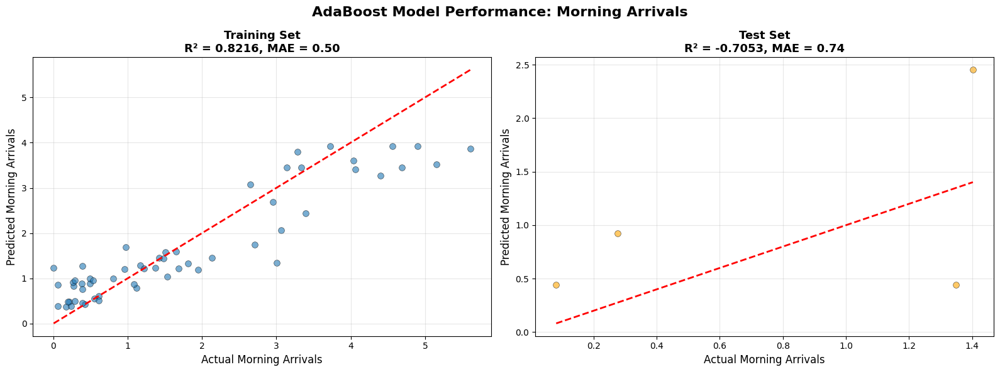


✅ Visualization complete!


In [238]:
# ======================================================================
# VISUALIZE MORNING ARRIVALS PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING MORNING ARRIVALS PREDICTIONS")
print("="*80)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('AdaBoost Model Performance: Morning Arrivals', 
             fontsize=16, fontweight='bold')

# Training set
axes[0].scatter(y_train_morning_arr, y_train_pred_morning_arr, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0].plot([y_train_morning_arr.min(), y_train_morning_arr.max()], 
            [y_train_morning_arr.min(), y_train_morning_arr.max()], 'r--', lw=2)
axes[0].set_xlabel('Actual Morning Arrivals', fontsize=12)
axes[0].set_ylabel('Predicted Morning Arrivals', fontsize=12)
axes[0].set_title(f'Training Set\nR² = {r2_score(y_train_morning_arr, y_train_pred_morning_arr):.4f}, MAE = {mean_absolute_error(y_train_morning_arr, y_train_pred_morning_arr):.2f}', 
                 fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Test set
axes[1].scatter(y_test_morning_arr, y_test_pred_morning_arr, alpha=0.6, s=50, color='orange', edgecolors='black', linewidth=0.5)
axes[1].plot([y_test_morning_arr.min(), y_test_morning_arr.max()], 
            [y_test_morning_arr.min(), y_test_morning_arr.max()], 'r--', lw=2)
axes[1].set_xlabel('Actual Morning Arrivals', fontsize=12)
axes[1].set_ylabel('Predicted Morning Arrivals', fontsize=12)
axes[1].set_title(f'Test Set\nR² = {r2_score(y_test_morning_arr, y_test_pred_morning_arr):.4f}, MAE = {mean_absolute_error(y_test_morning_arr, y_test_pred_morning_arr):.2f}', 
                 fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [239]:
# ======================================================================
# PREDICT MORNING ARRIVALS FOR ALL ZONES AND EXPORT TO CSV (DAILY ONLY)
# ======================================================================

print("="*100)
print("GENERATING MORNING ARRIVAL PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)")
print("="*100)

# Prepare features for ALL zones
all_zones_data = zones_2020.copy()

# Fill missing values with 0
if 'morning_arrivals_total' not in all_zones_data.columns:
    all_zones_data['morning_arrivals_total'] = 0

all_zones_data['morning_arrivals_total'] = all_zones_data['morning_arrivals_total'].fillna(0).astype(int)

# Calculate actual daily arrivals
all_zones_data['actual_morning_arrivals_daily'] = all_zones_data['morning_arrivals_total']

# Prepare feature matrix
X_all_zones_morning_arr = all_zones_data[feature_cols_morning_arr].fillna(0)

#print(f"\nTotal zones to predict: {len(all_zones_data)}")
#print(f"  Zones with actual morning activity > 0: {(all_zones_data['morning_total'] > 0).sum()}")
#print(f"  Zones with zero morning activity: {(all_zones_data['morning_total'] == 0).sum()}")
#print(f"Features used: {feature_cols_morning_arr}")

# Make predictions
print("\n📊 Making predictions...")
predicted_morning_arrivals_daily = ada_morning_arrivals.predict(X_all_zones_morning_arr)

# Create predictions dataframe (DAILY ONLY)
predictions_morning_arrivals_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data.get('poi_residential_count', pd.Series([0]*len(all_zones_data))).values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_morning_arrivals_daily': all_zones_data['actual_morning_arrivals_daily'].values.round(2),
    'predicted_morning_arrivals_daily': predicted_morning_arrivals_daily.round(2),
    'arrivals_error_daily': (all_zones_data['actual_morning_arrivals_daily'].values - predicted_morning_arrivals_daily).round(2)
})

# Sort by zone_id
predictions_morning_arrivals_all = predictions_morning_arrivals_all.sort_values('zone_id').reset_index(drop=True)

# Export to CSV
output_filename = f'{BASE_DIR}/zone_morning_arrivals_predictions_daily.csv'
predictions_morning_arrivals_all.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")
print(f"\n📊 Summary of predictions (DAILY COUNTS):")
print(f"   Total zones predicted: {len(predictions_morning_arrivals_all)}")
print(f"   Average daily actual arrivals: {predictions_morning_arrivals_all['actual_morning_arrivals_daily'].sum():.2f}")
print(f"   Average daily predicted arrivals: {predictions_morning_arrivals_all['predicted_morning_arrivals_daily'].sum():.2f}")

# Calculate error metrics
mean_absolute_error_val = predictions_morning_arrivals_all['arrivals_error_daily'].abs().mean()
print(f"\n📈 Error Metrics (Daily):")
print(f"   Mean absolute error: {mean_absolute_error_val:.2f}")
print(f"   Mean error: {predictions_morning_arrivals_all['arrivals_error_daily'].mean():.2f}")
print(f"   Median absolute error: {predictions_morning_arrivals_all['arrivals_error_daily'].abs().median():.2f}")

# Display first 20 rows
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols = ['zone_id', 'longitude', 'latitude', 
                'actual_morning_arrivals_daily', 
                'predicted_morning_arrivals_daily', 
                'arrivals_error_daily']
print(predictions_morning_arrivals_all[display_cols].head(20).to_string(index=False))

print("\n" + "="*100)
print("✅ ALL DONE! CSV file exported with DAILY counts only.")
print("="*100)

GENERATING MORNING ARRIVAL PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_morning_arrivals_predictions_daily.csv

📊 Summary of predictions (DAILY COUNTS):
   Total zones predicted: 383
   Average daily actual arrivals: 78.00
   Average daily predicted arrivals: 406.17

📈 Error Metrics (Daily):
   Mean absolute error: 0.91
   Mean error: -0.86
   Median absolute error: 0.86

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_morning_arrivals_daily  predicted_morning_arrivals_daily  arrivals_error_daily
      29  -3.203014 55.863763                              0                              0.84                 -0.84
      30  -3.191947 55.863871                              0                              0.92                 -0.

# Afternoon Departures

In [240]:
# ======================================================================
# LOAD AFTERNOON DATA AND MERGE WITH ZONES_2020
# ======================================================================

print("="*100)
print("LOADING AFTERNOON DATA FROM CSV")
print("="*100)

# Load afternoon counts
AFTERNOON_FP = f"{BASE_DIR}/afternoon_counts.csv"
afternoon_raw = pd.read_csv(AFTERNOON_FP)

print(f"\n📂 Afternoon data file: {AFTERNOON_FP}")
print(f"   Total stations: {len(afternoon_raw)}")
print(f"   Columns: {list(afternoon_raw.columns)}")

# Ensure station_id is numeric
afternoon_raw['station_id'] = pd.to_numeric(afternoon_raw['station_id'], errors='coerce').astype('Int64')
afternoon_raw = afternoon_raw.dropna(subset=['station_id'])

# Merge with station-to-zone mapping
station_zone_map = existing_station_ids.drop_duplicates('station_id')
afternoon_with_zone = afternoon_raw.merge(station_zone_map, on='station_id', how='left')

print(f"\n🔗 Merge results:")
print(f"   Stations with zone: {afternoon_with_zone['zone_id'].notna().sum()}")
print(f"   Stations without zone: {afternoon_with_zone['zone_id'].isna().sum()}")

# Remove unmapped stations
afternoon_with_zone_clean = afternoon_with_zone.dropna(subset=['zone_id']).copy()
afternoon_with_zone_clean['zone_id'] = afternoon_with_zone_clean['zone_id'].astype(int)

# Identify departure and arrival columns
afternoon_cols = [c for c in afternoon_raw.columns if c != 'station_id']
departure_cols = [c for c in afternoon_cols if 'dep' in c.lower()]
arrival_cols = [c for c in afternoon_cols if 'arr' in c.lower()]

print(f"\n📊 Column detection:")
print(f"   Departure columns: {departure_cols}")
print(f"   Arrival columns: {arrival_cols}")

# Aggregate by zone
agg_dict = {c: 'sum' for c in afternoon_cols}
zone_afternoon = afternoon_with_zone_clean.groupby('zone_id').agg(agg_dict).reset_index()

# Create total columns (multiply by 184 to get period totals)
if departure_cols:
    zone_afternoon['afternoon_departures_total'] = zone_afternoon[departure_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No departure columns found")
    zone_afternoon['afternoon_departures_total'] = 0

if arrival_cols:
    zone_afternoon['afternoon_arrivals_total'] = zone_afternoon[arrival_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No arrival columns found")
    zone_afternoon['afternoon_arrivals_total'] = 0

zone_afternoon['afternoon_total'] = zone_afternoon['afternoon_departures_total'] + zone_afternoon['afternoon_arrivals_total']

print(f"\n📈 Aggregation results:")
print(f"   Zones with afternoon data: {len(zone_afternoon)}")
print(f"   Total afternoon departures: {zone_afternoon['afternoon_departures_total'].sum():,.0f}")
print(f"   Total afternoon arrivals: {zone_afternoon['afternoon_arrivals_total'].sum():,.0f}")
print(f"   Total afternoon activity: {zone_afternoon['afternoon_total'].sum():,.0f}")

# Merge with zones_2020
zones_2020 = zones_2020.merge(
    zone_afternoon[['zone_id', 'afternoon_departures_total', 'afternoon_arrivals_total', 'afternoon_total']],
    on='zone_id',
    how='left'
)

# Fill NaN with 0
zones_2020['afternoon_departures_total'] = zones_2020['afternoon_departures_total'].fillna(0).astype(int)
zones_2020['afternoon_arrivals_total'] = zones_2020['afternoon_arrivals_total'].fillna(0).astype(int)
zones_2020['afternoon_total'] = zones_2020['afternoon_total'].fillna(0).astype(int)

print(f"\n✅ Afternoon data merged with zones_2020!")
print(f"   Zones with afternoon activity > 0: {(zones_2020['afternoon_total'] > 0).sum()}")
print(f"   Zones with zero afternoon activity: {(zones_2020['afternoon_total'] == 0).sum()}")

print("\n" + "="*100)
print("✅ AFTERNOON DATA LOADED SUCCESSFULLY!")
print("="*100)

LOADING AFTERNOON DATA FROM CSV

📂 Afternoon data file: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/afternoon_counts.csv
   Total stations: 112
   Columns: ['station_id', 'departure_count', 'arrival_count']

🔗 Merge results:
   Stations with zone: 102
   Stations without zone: 10

📊 Column detection:
   Departure columns: ['departure_count']
   Arrival columns: ['arrival_count']

📈 Aggregation results:
   Zones with afternoon data: 64
   Total afternoon departures: 58,996
   Total afternoon arrivals: 58,916
   Total afternoon activity: 117,912

✅ Afternoon data merged with zones_2020!
   Zones with afternoon activity > 0: 60
   Zones with zero afternoon activity: 323

✅ AFTERNOON DATA LOADED SUCCESSFULLY!


In [241]:
# ======================================================================
# PREPARE DATA FOR AFTERNOON DEPARTURES PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR AFTERNOON DEPARTURES PREDICTION")
print("="*80)

# Check if afternoon data is available
if 'afternoon_total' not in zones_2020.columns:
    print("❌ ERROR: Afternoon data not found. Please run the afternoon data loading cell first.")
else:
    # Filter to zones with afternoon activity
    zones_for_afternoon_model = zones_2020[zones_2020['afternoon_total'] > 0].copy()
    
    print(f"\nZones with afternoon demand: {len(zones_for_afternoon_model)}")
    
    # Calculate daily departures
    if 'afternoon_departures_total' in zones_for_afternoon_model.columns:
        zones_for_afternoon_model['afternoon_departures_daily'] = zones_for_afternoon_model['afternoon_departures_total']
    
    print(f"\n⚠️  NOTE: Afternoon data is in daily counts")
    print(f"\nTarget variable statistics:")
    print(f"  Afternoon Departures Daily - Mean: {zones_for_afternoon_model['afternoon_departures_daily'].mean():.2f}")
    print(f"  Afternoon Departures Daily - Std: {zones_for_afternoon_model['afternoon_departures_daily'].std():.2f}")
    
    # Use same features
    feature_cols_afternoon = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                              'poi_library_count', 'poi_school_count', 
                              'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_afternoon}")
    
    # Prepare features and target
    X_afternoon = zones_for_afternoon_model[feature_cols_afternoon].fillna(0)
    y_afternoon_dep = zones_for_afternoon_model['afternoon_departures_daily']
    
    print(f"\nFeature matrix shape: {X_afternoon.shape}")
    print(f"Target shape: {y_afternoon_dep.shape}")
    
    # Split data
    X_train_afternoon, X_test_afternoon, y_train_afternoon, y_test_afternoon = train_test_split(
        X_afternoon, y_afternoon_dep, test_size=0.1, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_afternoon)}")
    print(f"Test set size: {len(X_test_afternoon)}")
    print("="*80)

PREPARING DATA FOR AFTERNOON DEPARTURES PREDICTION

Zones with afternoon demand: 60

⚠️  NOTE: Afternoon data is in daily counts

Target variable statistics:
  Afternoon Departures Daily - Mean: 940.50
  Afternoon Departures Daily - Std: 856.69

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (60, 8)
Target shape: (60,)

Train set size: 54
Test set size: 6


In [242]:
# ======================================================================
# TRAIN ADABOOST FOR AFTERNOON DEPARTURES PREDICTION
# ======================================================================

print("="*80)
print("TRAINING ADABOOST MODEL FOR AFTERNOON DEPARTURES PREDICTION")
print("="*80)

# Train AdaBoost
ada_afternoon_departures = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_afternoon_departures.fit(X_train_afternoon, y_train_afternoon)

# Make predictions
y_train_pred_afternoon = ada_afternoon_departures.predict(X_train_afternoon)
y_test_pred_afternoon = ada_afternoon_departures.predict(X_test_afternoon)

# Evaluate model
print("\n📊 AFTERNOON DEPARTURES MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_afternoon, y_train_pred_afternoon):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_afternoon, y_train_pred_afternoon)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_afternoon, y_train_pred_afternoon):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_afternoon, y_test_pred_afternoon):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_afternoon, y_test_pred_afternoon)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_afternoon, y_test_pred_afternoon):.2f}")

# Feature importance
print("\n🎯 Feature Importance (Afternoon Departures):")
print("-" * 80)
importance_df_afternoon = pd.DataFrame({
    'Feature': feature_cols_afternoon,
    'Importance': ada_afternoon_departures.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_afternoon.to_string(index=False))

# Sample predictions
print("\n📈 Sample Predictions vs Actual (Test Set - Afternoon Departures):")
print("-" * 80)
comparison_afternoon = pd.DataFrame({
    'Actual_Afternoon_Departures': y_test_afternoon.values[:15],
    'Predicted_Afternoon_Departures': y_test_pred_afternoon[:15],
    'Error': y_test_afternoon.values[:15] - y_test_pred_afternoon[:15]
})
print(comparison_afternoon.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR AFTERNOON DEPARTURES PREDICTION

📊 AFTERNOON DEPARTURES MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8368
  RMSE: 335.49
  MAE: 246.78

Test Performance:
  R² Score: 0.5722
  RMSE: 656.08
  MAE: 399.20

🎯 Feature Importance (Afternoon Departures):
--------------------------------------------------------------------------------
             Feature  Importance
           longitude    0.233707
  population_density    0.212974
   poi_library_count    0.153367
poi_commercial_count    0.145635
            latitude    0.135693
poi_university_count    0.106208
    poi_school_count    0.009813
  poi_hospital_count    0.002604

📈 Sample Predictions vs Actual (Test Set - Afternoon Departures):
--------------------------------------------------------------------------------
 Actual_Afternoon_Departures  Predicted_Afternoon_Departures       Error
                         114     

VISUALIZING AFTERNOON DEPARTURES PREDICTIONS


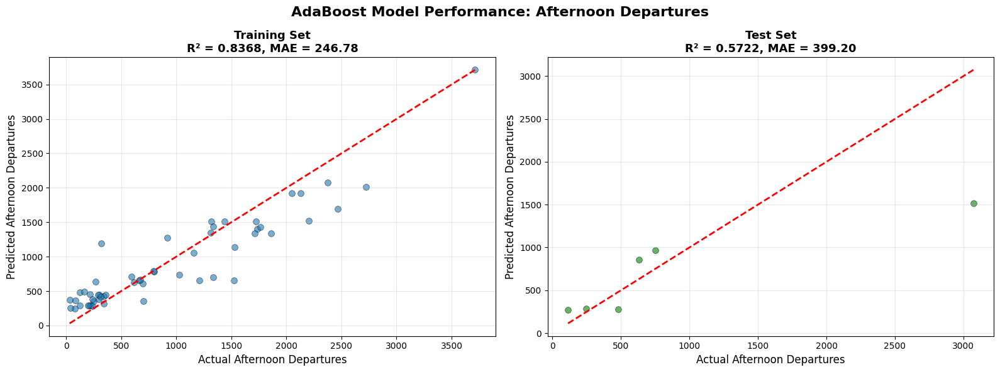


✅ Visualization complete!


In [243]:
# ======================================================================
# VISUALIZE AFTERNOON DEPARTURES PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING AFTERNOON DEPARTURES PREDICTIONS")
print("="*80)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('AdaBoost Model Performance: Afternoon Departures', 
             fontsize=16, fontweight='bold')

# Training set
axes[0].scatter(y_train_afternoon, y_train_pred_afternoon, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0].plot([y_train_afternoon.min(), y_train_afternoon.max()], 
            [y_train_afternoon.min(), y_train_afternoon.max()], 'r--', lw=2)
axes[0].set_xlabel('Actual Afternoon Departures', fontsize=12)
axes[0].set_ylabel('Predicted Afternoon Departures', fontsize=12)
axes[0].set_title(f'Training Set\nR² = {r2_score(y_train_afternoon, y_train_pred_afternoon):.4f}, MAE = {mean_absolute_error(y_train_afternoon, y_train_pred_afternoon):.2f}', 
                 fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Test set
axes[1].scatter(y_test_afternoon, y_test_pred_afternoon, alpha=0.6, s=50, color='green', edgecolors='black', linewidth=0.5)
axes[1].plot([y_test_afternoon.min(), y_test_afternoon.max()], 
            [y_test_afternoon.min(), y_test_afternoon.max()], 'r--', lw=2)
axes[1].set_xlabel('Actual Afternoon Departures', fontsize=12)
axes[1].set_ylabel('Predicted Afternoon Departures', fontsize=12)
axes[1].set_title(f'Test Set\nR² = {r2_score(y_test_afternoon, y_test_pred_afternoon):.4f}, MAE = {mean_absolute_error(y_test_afternoon, y_test_pred_afternoon):.2f}', 
                 fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [244]:
# ======================================================================
# PREDICT AFTERNOON DEPARTURES FOR ALL ZONES AND EXPORT TO CSV
# ======================================================================

print("="*100)
print("GENERATING AFTERNOON DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)")
print("="*100)

# Prepare features for ALL zones
all_zones_data = zones_2020.copy()

# Fill missing values with 0
if 'afternoon_departures_total' not in all_zones_data.columns:
    all_zones_data['afternoon_departures_total'] = 0

all_zones_data['afternoon_departures_total'] = all_zones_data['afternoon_departures_total'].fillna(0).astype(int)
all_zones_data['actual_afternoon_departures_daily'] = all_zones_data['afternoon_departures_total']

# Prepare feature matrix
X_all_zones_afternoon = all_zones_data[feature_cols_afternoon].fillna(0)

print(f"\nTotal zones to predict: {len(all_zones_data)}")
print(f"  Zones with actual afternoon activity > 0: {(all_zones_data['afternoon_total'] > 0).sum()}")
print(f"  Zones with zero afternoon activity: {(all_zones_data['afternoon_total'] == 0).sum()}")

# Make predictions
print("\n📊 Making predictions...")
predicted_afternoon_departures_daily = ada_afternoon_departures.predict(X_all_zones_afternoon)

# Create predictions dataframe
predictions_afternoon_departures_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data.get('poi_residential_count', pd.Series([0]*len(all_zones_data))).values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_afternoon_departures_daily': all_zones_data['actual_afternoon_departures_daily'].values.round(2),
    'predicted_afternoon_departures_daily': predicted_afternoon_departures_daily.round(2),
    'departures_error_daily': (all_zones_data['actual_afternoon_departures_daily'].values - predicted_afternoon_departures_daily).round(2)
})

# Sort and export
predictions_afternoon_departures_all = predictions_afternoon_departures_all.sort_values('zone_id').reset_index(drop=True)
output_filename = f'{BASE_DIR}/zone_afternoon_departures_predictions_daily.csv'
predictions_afternoon_departures_all.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")

# Display sample
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols = ['zone_id', 'longitude', 'latitude', 
                'actual_afternoon_departures_daily', 
                'predicted_afternoon_departures_daily', 
                'departures_error_daily']
print(predictions_afternoon_departures_all[display_cols].head(20).to_string(index=False))
print("\n" + "="*100)

GENERATING AFTERNOON DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)

Total zones to predict: 383
  Zones with actual afternoon activity > 0: 60
  Zones with zero afternoon activity: 323

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_afternoon_departures_predictions_daily.csv

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_afternoon_departures_daily  predicted_afternoon_departures_daily  departures_error_daily
      29  -3.203014 55.863763                                  0                                445.93                 -445.93
      30  -3.191947 55.863871                                  0                                445.93                 -445.93
      31  -3.180880 55.863978                                  0                                445.93  

In [245]:
# ======================================================================
# AFTERNOON ARRIVALS PREDICTION
# ======================================================================

print("="*80)
print("PREPARING DATA FOR AFTERNOON ARRIVALS PREDICTION")
print("="*80)

# Filter to zones with afternoon activity
zones_for_afternoon_arr_model = zones_2020[zones_2020['afternoon_total'] > 0].copy()
zones_for_afternoon_arr_model['afternoon_arrivals_daily'] = zones_for_afternoon_arr_model['afternoon_arrivals_total']

feature_cols_afternoon_arr = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                              'poi_library_count', 'poi_school_count', 
                              'poi_university_count', 'population_density']

X_afternoon_arr = zones_for_afternoon_arr_model[feature_cols_afternoon_arr].fillna(0)
y_afternoon_arr = zones_for_afternoon_arr_model['afternoon_arrivals_daily']

X_train_afternoon_arr, X_test_afternoon_arr, y_train_afternoon_arr, y_test_afternoon_arr = train_test_split(
    X_afternoon_arr, y_afternoon_arr, test_size=0.1, random_state=42
)

print(f"Train set size: {len(X_train_afternoon_arr)}")
print(f"Test set size: {len(X_test_afternoon_arr)}")

# Train model
ada_afternoon_arrivals = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_afternoon_arrivals.fit(X_train_afternoon_arr, y_train_afternoon_arr)

y_train_pred_afternoon_arr = ada_afternoon_arrivals.predict(X_train_afternoon_arr)
y_test_pred_afternoon_arr = ada_afternoon_arrivals.predict(X_test_afternoon_arr)

print("\n📊 AFTERNOON ARRIVALS MODEL PERFORMANCE:")
print(f"Test R² Score: {r2_score(y_test_afternoon_arr, y_test_pred_afternoon_arr):.4f}")
print(f"Test MAE: {mean_absolute_error(y_test_afternoon_arr, y_test_pred_afternoon_arr):.2f}")

# Predict for all zones and export
predicted_afternoon_arrivals_daily = ada_afternoon_arrivals.predict(X_all_zones_afternoon)

predictions_afternoon_arrivals_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'actual_afternoon_arrivals_daily': all_zones_data['afternoon_arrivals_total'].values.round(2),
    'predicted_afternoon_arrivals_daily': predicted_afternoon_arrivals_daily.round(2),
    'arrivals_error_daily': (all_zones_data['afternoon_arrivals_total'].values - predicted_afternoon_arrivals_daily).round(2)
})

predictions_afternoon_arrivals_all = predictions_afternoon_arrivals_all.sort_values('zone_id').reset_index(drop=True)
output_filename_arr = f'{BASE_DIR}/zone_afternoon_arrivals_predictions_daily.csv'
predictions_afternoon_arrivals_all.to_csv(output_filename_arr, index=False)

print(f"\n✅ Afternoon arrivals predictions saved to: {output_filename_arr}")
print("="*80)

PREPARING DATA FOR AFTERNOON ARRIVALS PREDICTION
Train set size: 54
Test set size: 6

📊 AFTERNOON ARRIVALS MODEL PERFORMANCE:
Test R² Score: 0.4414
Test MAE: 393.82

✅ Afternoon arrivals predictions saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_afternoon_arrivals_predictions_daily.csv


# Evening Arrival and Departure

In [246]:
# ======================================================================
# LOAD EVENING DATA AND MERGE WITH ZONES_2020
# ======================================================================

print("="*100)
print("LOADING EVENING DATA FROM CSV")
print("="*100)

# Load evening counts
EVENING_FP = f"{BASE_DIR}/evening_counts.csv"
evening_raw = pd.read_csv(EVENING_FP)

print(f"\n📂 Evening data file: {EVENING_FP}")
print(f"   Total stations: {len(evening_raw)}")
print(f"   Columns: {list(evening_raw.columns)}")

# Ensure station_id is numeric
evening_raw['station_id'] = pd.to_numeric(evening_raw['station_id'], errors='coerce').astype('Int64')
evening_raw = evening_raw.dropna(subset=['station_id'])

# Merge with station-to-zone mapping
station_zone_map = existing_station_ids.drop_duplicates('station_id')
evening_with_zone = evening_raw.merge(station_zone_map, on='station_id', how='left')

print(f"\n🔗 Merge results:")
print(f"   Stations with zone: {evening_with_zone['zone_id'].notna().sum()}")
print(f"   Stations without zone: {evening_with_zone['zone_id'].isna().sum()}")

# Remove unmapped stations
evening_with_zone_clean = evening_with_zone.dropna(subset=['zone_id']).copy()
evening_with_zone_clean['zone_id'] = evening_with_zone_clean['zone_id'].astype(int)

# Identify departure and arrival columns
evening_cols = [c for c in evening_raw.columns if c != 'station_id']
departure_cols = [c for c in evening_cols if 'dep' in c.lower()]
arrival_cols = [c for c in evening_cols if 'arr' in c.lower()]

print(f"\n📊 Column detection:")
print(f"   Departure columns: {departure_cols}")
print(f"   Arrival columns: {arrival_cols}")

# Aggregate by zone
agg_dict = {c: 'sum' for c in evening_cols}
zone_evening = evening_with_zone_clean.groupby('zone_id').agg(agg_dict).reset_index()

# Create total columns (multiply by 184 to get period totals)
if departure_cols:
    zone_evening['evening_departures_total'] = zone_evening[departure_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No departure columns found")
    zone_evening['evening_departures_total'] = 0

if arrival_cols:
    zone_evening['evening_arrivals_total'] = zone_evening[arrival_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No arrival columns found")
    zone_evening['evening_arrivals_total'] = 0

zone_evening['evening_total'] = zone_evening['evening_departures_total'] + zone_evening['evening_arrivals_total']

print(f"\n📈 Aggregation results:")
print(f"   Zones with evening data: {len(zone_evening)}")
print(f"   Total evening departures: {zone_evening['evening_departures_total'].sum():,.0f}")
print(f"   Total evening arrivals: {zone_evening['evening_arrivals_total'].sum():,.0f}")
print(f"   Total evening activity: {zone_evening['evening_total'].sum():,.0f}")

# Merge with zones_2020
zones_2020 = zones_2020.merge(
    zone_evening[['zone_id', 'evening_departures_total', 'evening_arrivals_total', 'evening_total']],
    on='zone_id',
    how='left'
)

# Fill NaN with 0
zones_2020['evening_departures_total'] = zones_2020['evening_departures_total'].fillna(0).astype(int)
zones_2020['evening_arrivals_total'] = zones_2020['evening_arrivals_total'].fillna(0).astype(int)
zones_2020['evening_total'] = zones_2020['evening_total'].fillna(0).astype(int)

print(f"\n✅ Evening data merged with zones_2020!")
print(f"   Zones with evening activity > 0: {(zones_2020['evening_total'] > 0).sum()}")
print(f"   Zones with zero evening activity: {(zones_2020['evening_total'] == 0).sum()}")

print("\n" + "="*100)
print("✅ EVENING DATA LOADED SUCCESSFULLY!")
print("="*100)

LOADING EVENING DATA FROM CSV

📂 Evening data file: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/evening_counts.csv
   Total stations: 112
   Columns: ['station_id', 'departure_count', 'arrival_count']

🔗 Merge results:
   Stations with zone: 102
   Stations without zone: 10

📊 Column detection:
   Departure columns: ['departure_count']
   Arrival columns: ['arrival_count']

📈 Aggregation results:
   Zones with evening data: 64
   Total evening departures: 29,574
   Total evening arrivals: 29,586
   Total evening activity: 59,160

✅ Evening data merged with zones_2020!
   Zones with evening activity > 0: 60
   Zones with zero evening activity: 323

✅ EVENING DATA LOADED SUCCESSFULLY!


In [247]:
# ======================================================================
# PREPARE DATA FOR EVENING DEPARTURES PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR EVENING DEPARTURES PREDICTION")
print("="*80)

# Check if evening data is available
if 'evening_total' not in zones_2020.columns:
    print("❌ ERROR: Evening data not found. Please run the evening data loading cell first.")
else:
    # Filter to zones with evening activity
    zones_for_evening_model = zones_2020[zones_2020['evening_total'] > 0].copy()
    
    print(f"\nZones with evening demand: {len(zones_for_evening_model)}")
    
    # Calculate daily departures
    if 'evening_departures_total' in zones_for_evening_model.columns:
        zones_for_evening_model['evening_departures_daily'] = zones_for_evening_model['evening_departures_total']
    
    print(f"\n⚠️  NOTE: Evening data is in daily counts")
    print(f"\nTarget variable statistics:")
    print(f"  Evening Departures Daily - Mean: {zones_for_evening_model['evening_departures_daily'].mean():.2f}")
    print(f"  Evening Departures Daily - Std: {zones_for_evening_model['evening_departures_daily'].std():.2f}")
    
    # Use same features
    feature_cols_evening = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                            'poi_library_count', 'poi_school_count', 
                            'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_evening}")
    
    # Prepare features and target
    X_evening = zones_for_evening_model[feature_cols_evening].fillna(0)
    y_evening_dep = zones_for_evening_model['evening_departures_daily']
    
    print(f"\nFeature matrix shape: {X_evening.shape}")
    print(f"Target shape: {y_evening_dep.shape}")
    
    # Split data
    X_train_evening, X_test_evening, y_train_evening, y_test_evening = train_test_split(
        X_evening, y_evening_dep, test_size=0.1, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_evening)}")
    print(f"Test set size: {len(X_test_evening)}")
    print("="*80)

PREPARING DATA FOR EVENING DEPARTURES PREDICTION

Zones with evening demand: 60

⚠️  NOTE: Evening data is in daily counts

Target variable statistics:
  Evening Departures Daily - Mean: 477.58
  Evening Departures Daily - Std: 484.79

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (60, 8)
Target shape: (60,)

Train set size: 54
Test set size: 6


In [248]:
# ======================================================================
# PREPARE DATA FOR EVENING DEPARTURES PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR EVENING DEPARTURES PREDICTION")
print("="*80)

# Check if evening data is available
if 'evening_total' not in zones_2020.columns:
    print("❌ ERROR: Evening data not found. Please run the evening data loading cell first.")
else:
    # Filter to zones with evening activity
    zones_for_evening_model = zones_2020[zones_2020['evening_total'] > 0].copy()
    
    print(f"\nZones with evening demand: {len(zones_for_evening_model)}")
    
    # Calculate daily departures
    if 'evening_departures_total' in zones_for_evening_model.columns:
        zones_for_evening_model['evening_departures_daily'] = zones_for_evening_model['evening_departures_total']
    
    print(f"\n⚠️  NOTE: Evening data is in daily counts")
    print(f"\nTarget variable statistics:")
    print(f"  Evening Departures Daily - Mean: {zones_for_evening_model['evening_departures_daily'].mean():.2f}")
    print(f"  Evening Departures Daily - Std: {zones_for_evening_model['evening_departures_daily'].std():.2f}")
    
    # Use same features
    feature_cols_evening = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                            'poi_library_count', 'poi_school_count', 
                            'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_evening}")
    
    # Prepare features and target
    X_evening = zones_for_evening_model[feature_cols_evening].fillna(0)
    y_evening_dep = zones_for_evening_model['evening_departures_daily']
    
    print(f"\nFeature matrix shape: {X_evening.shape}")
    print(f"Target shape: {y_evening_dep.shape}")
    
    # Split data
    X_train_evening, X_test_evening, y_train_evening, y_test_evening = train_test_split(
        X_evening, y_evening_dep, test_size=0.1, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_evening)}")
    print(f"Test set size: {len(X_test_evening)}")
    print("="*80)

PREPARING DATA FOR EVENING DEPARTURES PREDICTION

Zones with evening demand: 60

⚠️  NOTE: Evening data is in daily counts

Target variable statistics:
  Evening Departures Daily - Mean: 477.58
  Evening Departures Daily - Std: 484.79

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (60, 8)
Target shape: (60,)

Train set size: 54
Test set size: 6


In [249]:
# ======================================================================
# TRAIN ADABOOST FOR EVENING DEPARTURES PREDICTION
# ======================================================================

print("="*80)
print("TRAINING ADABOOST MODEL FOR EVENING DEPARTURES PREDICTION")
print("="*80)

# Train AdaBoost
ada_evening_departures = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_evening_departures.fit(X_train_evening, y_train_evening)

# Make predictions
y_train_pred_evening = ada_evening_departures.predict(X_train_evening)
y_test_pred_evening = ada_evening_departures.predict(X_test_evening)

# Evaluate model
print("\n📊 EVENING DEPARTURES MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_evening, y_train_pred_evening):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_evening, y_train_pred_evening)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_evening, y_train_pred_evening):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_evening, y_test_pred_evening):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_evening, y_test_pred_evening)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_evening, y_test_pred_evening):.2f}")

# Feature importance
print("\n🎯 Feature Importance (Evening Departures):")
print("-" * 80)
importance_df_evening = pd.DataFrame({
    'Feature': feature_cols_evening,
    'Importance': ada_evening_departures.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_evening.to_string(index=False))

# Sample predictions
print("\n📈 Sample Predictions vs Actual (Test Set - Evening Departures):")
print("-" * 80)
comparison_evening = pd.DataFrame({
    'Actual_Evening_Departures': y_test_evening.values[:15],
    'Predicted_Evening_Departures': y_test_pred_evening[:15],
    'Error': y_test_evening.values[:15] - y_test_pred_evening[:15]
})
print(comparison_evening.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR EVENING DEPARTURES PREDICTION

📊 EVENING DEPARTURES MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.8476
  RMSE: 181.62
  MAE: 134.54

Test Performance:
  R² Score: 0.4013
  RMSE: 464.50
  MAE: 294.38

🎯 Feature Importance (Evening Departures):
--------------------------------------------------------------------------------
             Feature  Importance
  population_density    0.270386
   poi_library_count    0.204567
           longitude    0.184492
poi_commercial_count    0.119714
poi_university_count    0.118053
            latitude    0.089857
    poi_school_count    0.008407
  poi_hospital_count    0.004525

📈 Sample Predictions vs Actual (Test Set - Evening Departures):
--------------------------------------------------------------------------------
 Actual_Evening_Departures  Predicted_Evening_Departures       Error
                        55                   

VISUALIZING EVENING DEPARTURES PREDICTIONS


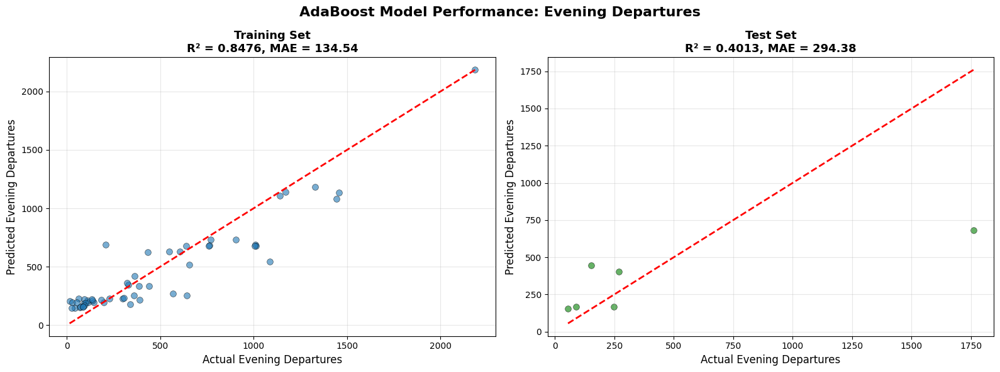


✅ Visualization complete!


In [250]:
# ======================================================================
# VISUALIZE EVENING DEPARTURES PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING EVENING DEPARTURES PREDICTIONS")
print("="*80)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('AdaBoost Model Performance: Evening Departures', 
             fontsize=16, fontweight='bold')

# Training set
axes[0].scatter(y_train_evening, y_train_pred_evening, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0].plot([y_train_evening.min(), y_train_evening.max()], 
            [y_train_evening.min(), y_train_evening.max()], 'r--', lw=2)
axes[0].set_xlabel('Actual Evening Departures', fontsize=12)
axes[0].set_ylabel('Predicted Evening Departures', fontsize=12)
axes[0].set_title(f'Training Set\nR² = {r2_score(y_train_evening, y_train_pred_evening):.4f}, MAE = {mean_absolute_error(y_train_evening, y_train_pred_evening):.2f}', 
                 fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Test set
axes[1].scatter(y_test_evening, y_test_pred_evening, alpha=0.6, s=50, color='green', edgecolors='black', linewidth=0.5)
axes[1].plot([y_test_evening.min(), y_test_evening.max()], 
            [y_test_evening.min(), y_test_evening.max()], 'r--', lw=2)
axes[1].set_xlabel('Actual Evening Departures', fontsize=12)
axes[1].set_ylabel('Predicted Evening Departures', fontsize=12)
axes[1].set_title(f'Test Set\nR² = {r2_score(y_test_evening, y_test_pred_evening):.4f}, MAE = {mean_absolute_error(y_test_evening, y_test_pred_evening):.2f}', 
                 fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [251]:
# ======================================================================
# PREDICT EVENING DEPARTURES FOR ALL ZONES AND EXPORT TO CSV
# ======================================================================

print("="*100)
print("GENERATING EVENING DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)")
print("="*100)

# Prepare features for ALL zones
all_zones_data = zones_2020.copy()

# Fill missing values with 0
if 'evening_departures_total' not in all_zones_data.columns:
    all_zones_data['evening_departures_total'] = 0

all_zones_data['evening_departures_total'] = all_zones_data['evening_departures_total'].fillna(0).astype(int)
all_zones_data['actual_evening_departures_daily'] = all_zones_data['evening_departures_total']

# Prepare feature matrix
X_all_zones_evening = all_zones_data[feature_cols_evening].fillna(0)

print(f"\nTotal zones to predict: {len(all_zones_data)}")
print(f"  Zones with actual evening activity > 0: {(all_zones_data['evening_total'] > 0).sum()}")
print(f"  Zones with zero evening activity: {(all_zones_data['evening_total'] == 0).sum()}")

# Make predictions
print("\n📊 Making predictions...")
predicted_evening_departures_daily = ada_evening_departures.predict(X_all_zones_evening)

# Create predictions dataframe
predictions_evening_departures_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data.get('poi_residential_count', pd.Series([0]*len(all_zones_data))).values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_evening_departures_daily': all_zones_data['actual_evening_departures_daily'].values.round(2),
    'predicted_evening_departures_daily': predicted_evening_departures_daily.round(2),
    'departures_error_daily': (all_zones_data['actual_evening_departures_daily'].values - predicted_evening_departures_daily).round(2)
})

# Sort and export
predictions_evening_departures_all = predictions_evening_departures_all.sort_values('zone_id').reset_index(drop=True)
output_filename = f'{BASE_DIR}/zone_evening_departures_predictions_daily.csv'
predictions_evening_departures_all.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")

# Display sample
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols = ['zone_id', 'longitude', 'latitude', 
                'actual_evening_departures_daily', 
                'predicted_evening_departures_daily', 
                'departures_error_daily']
print(predictions_evening_departures_all[display_cols].head(20).to_string(index=False))
print("\n" + "="*100)

GENERATING EVENING DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)

Total zones to predict: 383
  Zones with actual evening activity > 0: 60
  Zones with zero evening activity: 323

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_evening_departures_predictions_daily.csv

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_evening_departures_daily  predicted_evening_departures_daily  departures_error_daily
      29  -3.203014 55.863763                                0                              209.54                 -209.54
      30  -3.191947 55.863871                                0                              220.03                 -220.03
      31  -3.180880 55.863978                                0                              220.03                 -220.03
 

In [252]:
# ======================================================================
# EVENING ARRIVALS PREDICTION
# ======================================================================

print("="*80)
print("PREPARING DATA FOR EVENING ARRIVALS PREDICTION")
print("="*80)

# Filter to zones with evening activity
zones_for_evening_arr_model = zones_2020[zones_2020['evening_total'] > 0].copy()
zones_for_evening_arr_model['evening_arrivals_daily'] = zones_for_evening_arr_model['evening_arrivals_total']

feature_cols_evening_arr = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                            'poi_library_count', 'poi_school_count', 
                            'poi_university_count', 'population_density']

X_evening_arr = zones_for_evening_arr_model[feature_cols_evening_arr].fillna(0)
y_evening_arr = zones_for_evening_arr_model['evening_arrivals_daily']

X_train_evening_arr, X_test_evening_arr, y_train_evening_arr, y_test_evening_arr = train_test_split(
    X_evening_arr, y_evening_arr, test_size=0.1, random_state=42
)

print(f"Train set size: {len(X_train_evening_arr)}")
print(f"Test set size: {len(X_test_evening_arr)}")

# Train model
ada_evening_arrivals = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_evening_arrivals.fit(X_train_evening_arr, y_train_evening_arr)

y_train_pred_evening_arr = ada_evening_arrivals.predict(X_train_evening_arr)
y_test_pred_evening_arr = ada_evening_arrivals.predict(X_test_evening_arr)

print("\n📊 EVENING ARRIVALS MODEL PERFORMANCE:")
print(f"Test R² Score: {r2_score(y_test_evening_arr, y_test_pred_evening_arr):.4f}")
print(f"Test MAE: {mean_absolute_error(y_test_evening_arr, y_test_pred_evening_arr):.2f}")

# Predict for all zones and export
predicted_evening_arrivals_daily = ada_evening_arrivals.predict(X_all_zones_evening)

predictions_evening_arrivals_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'actual_evening_arrivals_daily': all_zones_data['evening_arrivals_total'].values.round(2),
    'predicted_evening_arrivals_daily': predicted_evening_arrivals_daily.round(2),
    'arrivals_error_daily': (all_zones_data['evening_arrivals_total'].values - predicted_evening_arrivals_daily).round(2)
})

predictions_evening_arrivals_all = predictions_evening_arrivals_all.sort_values('zone_id').reset_index(drop=True)
output_filename_arr = f'{BASE_DIR}/zone_evening_arrivals_predictions_daily.csv'
predictions_evening_arrivals_all.to_csv(output_filename_arr, index=False)

print(f"\n✅ Evening arrivals predictions saved to: {output_filename_arr}")
print("="*80)

PREPARING DATA FOR EVENING ARRIVALS PREDICTION
Train set size: 54
Test set size: 6

📊 EVENING ARRIVALS MODEL PERFORMANCE:
Test R² Score: 0.6828
Test MAE: 154.46

✅ Evening arrivals predictions saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_evening_arrivals_predictions_daily.csv


# Night Arrivals and Departures

In [253]:
# ======================================================================
# LOAD NIGHT DATA AND MERGE WITH ZONES_2020
# ======================================================================

print("="*100)
print("LOADING NIGHT DATA FROM CSV")
print("="*100)

# Load night counts
NIGHT_FP = f"{BASE_DIR}/night_counts.csv"
night_raw = pd.read_csv(NIGHT_FP)

print(f"\n📂 Night data file: {NIGHT_FP}")
print(f"   Total stations: {len(night_raw)}")
print(f"   Columns: {list(night_raw.columns)}")

# Ensure station_id is numeric
night_raw['station_id'] = pd.to_numeric(night_raw['station_id'], errors='coerce').astype('Int64')
night_raw = night_raw.dropna(subset=['station_id'])

# Merge with station-to-zone mapping
station_zone_map = existing_station_ids.drop_duplicates('station_id')
night_with_zone = night_raw.merge(station_zone_map, on='station_id', how='left')

print(f"\n🔗 Merge results:")
print(f"   Stations with zone: {night_with_zone['zone_id'].notna().sum()}")
print(f"   Stations without zone: {night_with_zone['zone_id'].isna().sum()}")

# Remove unmapped stations
night_with_zone_clean = night_with_zone.dropna(subset=['zone_id']).copy()
night_with_zone_clean['zone_id'] = night_with_zone_clean['zone_id'].astype(int)

# Identify departure and arrival columns
night_cols = [c for c in night_raw.columns if c != 'station_id']
departure_cols = [c for c in night_cols if 'dep' in c.lower()]
arrival_cols = [c for c in night_cols if 'arr' in c.lower()]

print(f"\n📊 Column detection:")
print(f"   Departure columns: {departure_cols}")
print(f"   Arrival columns: {arrival_cols}")

# Aggregate by zone
agg_dict = {c: 'sum' for c in night_cols}
zone_night = night_with_zone_clean.groupby('zone_id').agg(agg_dict).reset_index()

# Create total columns (multiply by 184 to get period totals)
if departure_cols:
    zone_night['night_departures_total'] = zone_night[departure_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No departure columns found")
    zone_night['night_departures_total'] = 0

if arrival_cols:
    zone_night['night_arrivals_total'] = zone_night[arrival_cols].sum(axis=1) * 184
else:
    print("⚠️  WARNING: No arrival columns found")
    zone_night['night_arrivals_total'] = 0

zone_night['night_total'] = zone_night['night_departures_total'] + zone_night['night_arrivals_total']

print(f"\n📈 Aggregation results:")
print(f"   Zones with night data: {len(zone_night)}")
print(f"   Total night departures: {zone_night['night_departures_total'].sum():,.0f}")
print(f"   Total night arrivals: {zone_night['night_arrivals_total'].sum():,.0f}")
print(f"   Total night activity: {zone_night['night_total'].sum():,.0f}")

# Merge with zones_2020
zones_2020 = zones_2020.merge(
    zone_night[['zone_id', 'night_departures_total', 'night_arrivals_total', 'night_total']],
    on='zone_id',
    how='left'
)

# Fill NaN with 0
zones_2020['night_departures_total'] = zones_2020['night_departures_total'].fillna(0).astype(int)
zones_2020['night_arrivals_total'] = zones_2020['night_arrivals_total'].fillna(0).astype(int)
zones_2020['night_total'] = zones_2020['night_total'].fillna(0).astype(int)

print(f"\n✅ Night data merged with zones_2020!")
print(f"   Zones with night activity > 0: {(zones_2020['night_total'] > 0).sum()}")
print(f"   Zones with zero night activity: {(zones_2020['night_total'] == 0).sum()}")

print("\n" + "="*100)
print("✅ NIGHT DATA LOADED SUCCESSFULLY!")
print("="*100)

LOADING NIGHT DATA FROM CSV

📂 Night data file: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/night_counts.csv
   Total stations: 112
   Columns: ['station_id', 'departure_count', 'arrival_count']

🔗 Merge results:
   Stations with zone: 102
   Stations without zone: 10

📊 Column detection:
   Departure columns: ['departure_count']
   Arrival columns: ['arrival_count']

📈 Aggregation results:
   Zones with night data: 64
   Total night departures: 16,630
   Total night arrivals: 16,592
   Total night activity: 33,222

✅ Night data merged with zones_2020!
   Zones with night activity > 0: 60
   Zones with zero night activity: 323

✅ NIGHT DATA LOADED SUCCESSFULLY!


In [254]:
# ======================================================================
# PREPARE DATA FOR NIGHT DEPARTURES PREDICTION (DAILY COUNTS)
# ======================================================================

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import numpy as np

print("="*80)
print("PREPARING DATA FOR NIGHT DEPARTURES PREDICTION")
print("="*80)

# Check if night data is available
if 'night_total' not in zones_2020.columns:
    print("❌ ERROR: Night data not found. Please run the night data loading cell first.")
else:
    # Filter to zones with night activity
    zones_for_night_model = zones_2020[zones_2020['night_total'] > 0].copy()
    
    print(f"\nZones with night demand: {len(zones_for_night_model)}")
    
    # Calculate daily departures
    if 'night_departures_total' in zones_for_night_model.columns:
        zones_for_night_model['night_departures_daily'] = zones_for_night_model['night_departures_total']
    
    print(f"\n⚠️  NOTE: Night data is in daily counts")
    print(f"\nTarget variable statistics:")
    print(f"  Night Departures Daily - Mean: {zones_for_night_model['night_departures_daily'].mean():.2f}")
    print(f"  Night Departures Daily - Std: {zones_for_night_model['night_departures_daily'].std():.2f}")
    
    # Use same features
    feature_cols_night = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                          'poi_library_count', 'poi_school_count', 
                          'poi_university_count', 'population_density']
    
    print(f"\nFeatures for modeling: {feature_cols_night}")
    
    # Prepare features and target
    X_night = zones_for_night_model[feature_cols_night].fillna(0)
    y_night_dep = zones_for_night_model['night_departures_daily']
    
    print(f"\nFeature matrix shape: {X_night.shape}")
    print(f"Target shape: {y_night_dep.shape}")
    
    # Split data
    X_train_night, X_test_night, y_train_night, y_test_night = train_test_split(
        X_night, y_night_dep, test_size=0.1, random_state=42
    )
    
    print(f"\nTrain set size: {len(X_train_night)}")
    print(f"Test set size: {len(X_test_night)}")
    print("="*80)

PREPARING DATA FOR NIGHT DEPARTURES PREDICTION

Zones with night demand: 60

⚠️  NOTE: Night data is in daily counts

Target variable statistics:
  Night Departures Daily - Mean: 273.68
  Night Departures Daily - Std: 324.13

Features for modeling: ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 'poi_library_count', 'poi_school_count', 'poi_university_count', 'population_density']

Feature matrix shape: (60, 8)
Target shape: (60,)

Train set size: 54
Test set size: 6


In [255]:
# ======================================================================
# TRAIN ADABOOST FOR NIGHT DEPARTURES PREDICTION
# ======================================================================

print("="*80)
print("TRAINING ADABOOST MODEL FOR NIGHT DEPARTURES PREDICTION")
print("="*80)

# Train AdaBoost
ada_night_departures = AdaBoostRegressor(n_estimators=100, random_state=42, learning_rate=0.1)
ada_night_departures.fit(X_train_night, y_train_night)

# Make predictions
y_train_pred_night = ada_night_departures.predict(X_train_night)
y_test_pred_night = ada_night_departures.predict(X_test_night)

# Evaluate model
print("\n📊 NIGHT DEPARTURES MODEL PERFORMANCE:")
print("-" * 80)
print("\nTraining Performance:")
print(f"  R² Score: {r2_score(y_train_night, y_train_pred_night):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_train_night, y_train_pred_night)):.2f}")
print(f"  MAE: {mean_absolute_error(y_train_night, y_train_pred_night):.2f}")

print("\nTest Performance:")
print(f"  R² Score: {r2_score(y_test_night, y_test_pred_night):.4f}")
print(f"  RMSE: {np.sqrt(mean_squared_error(y_test_night, y_test_pred_night)):.2f}")
print(f"  MAE: {mean_absolute_error(y_test_night, y_test_pred_night):.2f}")

# Feature importance
print("\n🎯 Feature Importance (Night Departures):")
print("-" * 80)
importance_df_night = pd.DataFrame({
    'Feature': feature_cols_night,
    'Importance': ada_night_departures.feature_importances_
}).sort_values('Importance', ascending=False)
print(importance_df_night.to_string(index=False))

# Sample predictions
print("\n📈 Sample Predictions vs Actual (Test Set - Night Departures):")
print("-" * 80)
comparison_night = pd.DataFrame({
    'Actual_Night_Departures': y_test_night.values[:15],
    'Predicted_Night_Departures': y_test_pred_night[:15],
    'Error': y_test_night.values[:15] - y_test_pred_night[:15]
})
print(comparison_night.to_string(index=False))
print("\n" + "="*80)

TRAINING ADABOOST MODEL FOR NIGHT DEPARTURES PREDICTION

📊 NIGHT DEPARTURES MODEL PERFORMANCE:
--------------------------------------------------------------------------------

Training Performance:
  R² Score: 0.9337
  RMSE: 78.86
  MAE: 64.19

Test Performance:
  R² Score: 0.2328
  RMSE: 380.23
  MAE: 191.76

🎯 Feature Importance (Night Departures):
--------------------------------------------------------------------------------
             Feature  Importance
  population_density    0.314904
poi_university_count    0.225462
           longitude    0.215933
   poi_library_count    0.083074
poi_commercial_count    0.073572
            latitude    0.073192
  poi_hospital_count    0.007372
    poi_school_count    0.006491

📈 Sample Predictions vs Actual (Test Set - Night Departures):
--------------------------------------------------------------------------------
 Actual_Night_Departures  Predicted_Night_Departures       Error
                      52                   71.294118  -19.2

VISUALIZING NIGHT DEPARTURES PREDICTIONS


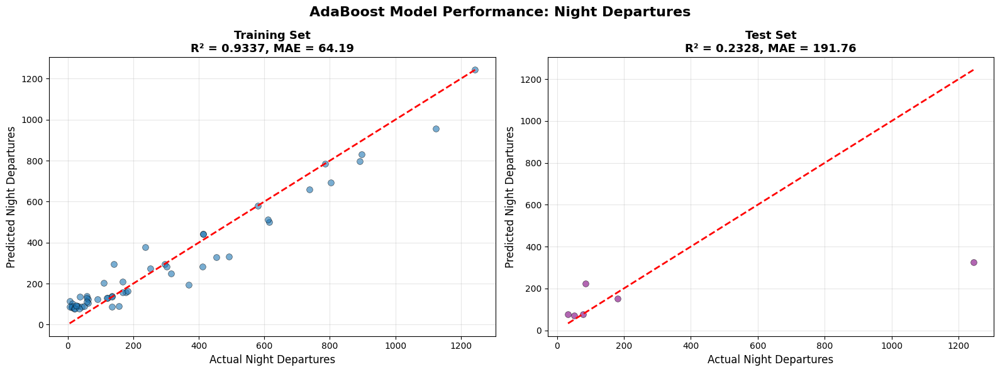


✅ Visualization complete!


In [256]:
# ======================================================================
# VISUALIZE NIGHT DEPARTURES PREDICTIONS
# ======================================================================

import matplotlib.pyplot as plt

print("="*80)
print("VISUALIZING NIGHT DEPARTURES PREDICTIONS")
print("="*80)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('AdaBoost Model Performance: Night Departures', 
             fontsize=16, fontweight='bold')

# Training set
axes[0].scatter(y_train_night, y_train_pred_night, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
axes[0].plot([y_train_night.min(), y_train_night.max()], 
            [y_train_night.min(), y_train_night.max()], 'r--', lw=2)
axes[0].set_xlabel('Actual Night Departures', fontsize=12)
axes[0].set_ylabel('Predicted Night Departures', fontsize=12)
axes[0].set_title(f'Training Set\nR² = {r2_score(y_train_night, y_train_pred_night):.4f}, MAE = {mean_absolute_error(y_train_night, y_train_pred_night):.2f}', 
                 fontsize=13, fontweight='bold')
axes[0].grid(True, alpha=0.3)

# Test set
axes[1].scatter(y_test_night, y_test_pred_night, alpha=0.6, s=50, color='purple', edgecolors='black', linewidth=0.5)
axes[1].plot([y_test_night.min(), y_test_night.max()], 
            [y_test_night.min(), y_test_night.max()], 'r--', lw=2)
axes[1].set_xlabel('Actual Night Departures', fontsize=12)
axes[1].set_ylabel('Predicted Night Departures', fontsize=12)
axes[1].set_title(f'Test Set\nR² = {r2_score(y_test_night, y_test_pred_night):.4f}, MAE = {mean_absolute_error(y_test_night, y_test_pred_night):.2f}', 
                 fontsize=13, fontweight='bold')
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✅ Visualization complete!")

In [257]:
# ======================================================================
# PREDICT NIGHT DEPARTURES FOR ALL ZONES AND EXPORT TO CSV
# ======================================================================

print("="*100)
print("GENERATING NIGHT DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)")
print("="*100)

# Prepare features for ALL zones
all_zones_data = zones_2020.copy()

# Fill missing values with 0
if 'night_departures_total' not in all_zones_data.columns:
    all_zones_data['night_departures_total'] = 0

all_zones_data['night_departures_total'] = all_zones_data['night_departures_total'].fillna(0).astype(int)
all_zones_data['actual_night_departures_daily'] = all_zones_data['night_departures_total']

# Prepare feature matrix
X_all_zones_night = all_zones_data[feature_cols_night].fillna(0)

print(f"\nTotal zones to predict: {len(all_zones_data)}")
print(f"  Zones with actual night activity > 0: {(all_zones_data['night_total'] > 0).sum()}")
print(f"  Zones with zero night activity: {(all_zones_data['night_total'] == 0).sum()}")

# Make predictions
print("\n📊 Making predictions...")
predicted_night_departures_daily = ada_night_departures.predict(X_all_zones_night)

# Create predictions dataframe
predictions_night_departures_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'poi_commercial_count': all_zones_data['poi_commercial_count'].values,
    'poi_hospital_count': all_zones_data['poi_hospital_count'].values,
    'poi_library_count': all_zones_data['poi_library_count'].values,
    'poi_residential_count': all_zones_data.get('poi_residential_count', pd.Series([0]*len(all_zones_data))).values,
    'poi_school_count': all_zones_data['poi_school_count'].values,
    'poi_university_count': all_zones_data['poi_university_count'].values,
    'population_density': all_zones_data['population_density'].values,
    'actual_night_departures_daily': all_zones_data['actual_night_departures_daily'].values.round(2),
    'predicted_night_departures_daily': predicted_night_departures_daily.round(2),
    'departures_error_daily': (all_zones_data['actual_night_departures_daily'].values - predicted_night_departures_daily).round(2)
})

# Sort and export
predictions_night_departures_all = predictions_night_departures_all.sort_values('zone_id').reset_index(drop=True)
output_filename = f'{BASE_DIR}/zone_night_departures_predictions_daily.csv'
predictions_night_departures_all.to_csv(output_filename, index=False)

print(f"\n✅ Predictions generated successfully!")
print(f"📁 File saved to: {output_filename}")

# Display sample
print("\n" + "="*100)
print("SAMPLE OF PREDICTIONS (First 20 zones)")
print("="*100)
display_cols = ['zone_id', 'longitude', 'latitude', 
                'actual_night_departures_daily', 
                'predicted_night_departures_daily', 
                'departures_error_daily']
print(predictions_night_departures_all[display_cols].head(20).to_string(index=False))
print("\n" + "="*100)

GENERATING NIGHT DEPARTURE PREDICTIONS FOR ALL ZONES (DAILY COUNTS ONLY)

Total zones to predict: 383
  Zones with actual night activity > 0: 60
  Zones with zero night activity: 323

📊 Making predictions...

✅ Predictions generated successfully!
📁 File saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_night_departures_predictions_daily.csv

SAMPLE OF PREDICTIONS (First 20 zones)
 zone_id  longitude  latitude  actual_night_departures_daily  predicted_night_departures_daily  departures_error_daily
      29  -3.203014 55.863763                              0                            128.64                 -128.64
      30  -3.191947 55.863871                              0                            135.00                 -135.00
      31  -3.180880 55.863978                              0                            130.67                 -130.67
      32  -3.169813 55.86

In [258]:
# ======================================================================
# NIGHT ARRIVALS PREDICTION
# ======================================================================

print("="*80)
print("PREPARING DATA FOR NIGHT ARRIVALS PREDICTION")
print("="*80)

# Filter to zones with night activity
zones_for_night_arr_model = zones_2020[zones_2020['night_total'] > 0].copy()
zones_for_night_arr_model['night_arrivals_daily'] = zones_for_night_arr_model['night_arrivals_total']

feature_cols_night_arr = ['longitude', 'latitude', 'poi_commercial_count', 'poi_hospital_count', 
                          'poi_library_count', 'poi_school_count', 
                          'poi_university_count', 'population_density']

X_night_arr = zones_for_night_arr_model[feature_cols_night_arr].fillna(0)
y_night_arr = zones_for_night_arr_model['night_arrivals_daily']

X_train_night_arr, X_test_night_arr, y_train_night_arr, y_test_night_arr = train_test_split(
    X_night_arr, y_night_arr, test_size=0.1, random_state=42
)

print(f"Train set size: {len(X_train_night_arr)}")
print(f"Test set size: {len(X_test_night_arr)}")

# Train model
ada_night_arrivals = AdaBoostRegressor(n_estimators=50, random_state=42, learning_rate=0.01)
ada_night_arrivals.fit(X_train_night_arr, y_train_night_arr)

y_train_pred_night_arr = ada_night_arrivals.predict(X_train_night_arr)
y_test_pred_night_arr = ada_night_arrivals.predict(X_test_night_arr)

print("\n📊 NIGHT ARRIVALS MODEL PERFORMANCE:")
print(f"Test R² Score: {r2_score(y_test_night_arr, y_test_pred_night_arr):.4f}")
print(f"Test MAE: {mean_absolute_error(y_test_night_arr, y_test_pred_night_arr):.2f}")

# Predict for all zones and export
predicted_night_arrivals_daily = ada_night_arrivals.predict(X_all_zones_night)

predictions_night_arrivals_all = pd.DataFrame({
    'zone_id': all_zones_data['zone_id'].values,
    'longitude': all_zones_data['longitude'].values,
    'latitude': all_zones_data['latitude'].values,
    'actual_night_arrivals_daily': all_zones_data['night_arrivals_total'].values.round(2),
    'predicted_night_arrivals_daily': predicted_night_arrivals_daily.round(2),
    'arrivals_error_daily': (all_zones_data['night_arrivals_total'].values - predicted_night_arrivals_daily).round(2)
})

predictions_night_arrivals_all = predictions_night_arrivals_all.sort_values('zone_id').reset_index(drop=True)
output_filename_arr = f'{BASE_DIR}/zone_night_arrivals_predictions_daily.csv'
predictions_night_arrivals_all.to_csv(output_filename_arr, index=False)

print(f"\n✅ Night arrivals predictions saved to: {output_filename_arr}")
print("="*80)

PREPARING DATA FOR NIGHT ARRIVALS PREDICTION
Train set size: 54
Test set size: 6

📊 NIGHT ARRIVALS MODEL PERFORMANCE:
Test R² Score: 0.5421
Test MAE: 99.86

✅ Night arrivals predictions saved to: /Users/alexjohnlabanon/Library/CloudStorage/OneDrive-UniversityofEdinburgh/1st Semester/Methodology Modelling and Consulting Skills/Final Project/Data/zone_night_arrivals_predictions_daily.csv


In [259]:
# ======================================================================
# FOLIUM DEMAND MAPS BY TIME PERIOD (DAILY AVERAGE)
# ======================================================================
import folium

PERIOD_DAYS = 184  # Jul–Dec 2020

# --- Ensure daily totals (morning already daily) ---
zones_2020['morning_total_daily']   = zones_2020.get('morning_total', 0)
zones_2020['afternoon_total_daily'] = zones_2020.get('afternoon_total', 0) / PERIOD_DAYS
zones_2020['evening_total_daily']   = zones_2020.get('evening_total', 0) / PERIOD_DAYS
zones_2020['night_total_daily']     = zones_2020.get('night_total', 0) / PERIOD_DAYS

# Merge geometry
period_cols = [
    'zone_id',
    'morning_total_daily',
    'afternoon_total_daily',
    'evening_total_daily',
    'night_total_daily'
]
zones_period_wgs84 = zones_wgs84[['zone_id','geometry']].merge(
    zones_2020[period_cols], on='zone_id', how='left'
).fillna(0)

def make_choropleth(gdf, value_col, title, palette):
    center_lat = gdf.geometry.centroid.y.mean()
    center_lon = gdf.geometry.centroid.x.mean()
    m = folium.Map(location=[center_lat, center_lon], zoom_start=12, tiles='CartoDB Positron')
    folium.Choropleth(
        geo_data=gdf.to_json(),
        data=gdf,
        columns=['zone_id', value_col],
        key_on='feature.properties.zone_id',
        fill_color=palette,
        fill_opacity=0.75,
        line_opacity=0.2,
        legend_name=title,
        nan_fill_color='white'
    ).add_to(m)
    folium.GeoJson(
        gdf.to_json(),
        style_function=lambda _: {'color':'transparent','weight':0},
        tooltip=folium.GeoJsonTooltip(
            fields=['zone_id', value_col],
            aliases=['Zone', title],
            localize=True,
            style='background-color: white; color: #000; font-size:12px; padding:6px;'
        )
    ).add_to(m)
    return m

map_morning   = make_choropleth(zones_period_wgs84, 'morning_total_daily',   'Morning Daily Demand',   'YlOrBr')
map_afternoon = make_choropleth(zones_period_wgs84, 'afternoon_total_daily', 'Afternoon Daily Demand', 'YlGn')
map_evening   = make_choropleth(zones_period_wgs84, 'evening_total_daily',   'Evening Daily Demand',   'PuRd')
map_night     = make_choropleth(zones_period_wgs84, 'night_total_daily',     'Night Daily Demand',     'Blues')

print("Morning map ↓");  display(map_morning)
print("Afternoon map ↓");display(map_afternoon)
print("Evening map ↓");  display(map_evening)
print("Night map ↓");    display(map_night)
# ======================================================================

/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2957901101.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2957901101.py:28: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/2957901101.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_82

Morning map ↓


Afternoon map ↓


Evening map ↓


Night map ↓


In [260]:
# ...existing code...
# ======================================================================
# PREDICTED DAILY DEMAND MAPS (ARRIVALS + DEPARTURES) BY TIME PERIOD
# ======================================================================
import os, pandas as pd, folium

# Ensure geometry GeoDataFrame
assert 'zones_wgs84' in globals(), "zones_wgs84 not found."

# Helper: load prediction CSV if DataFrame not already in memory
def ensure_df(var_name, filename):
    if var_name in globals():
        return globals()[var_name]
    fp = f"{BASE_DIR}/{filename}"
    if not os.path.exists(fp):
        raise FileNotFoundError(f"Missing prediction file: {fp}")
    df = pd.read_csv(fp)
    return df

# Morning
pred_morning_dep   = ensure_df('predictions_morning_all_zones',       'zone_morning_departures_predictions_daily.csv')
pred_morning_arr   = ensure_df('predictions_morning_arrivals_all',    'zone_morning_arrivals_predictions_daily.csv')

# Afternoon
pred_after_dep     = ensure_df('predictions_afternoon_departures_all','zone_afternoon_departures_predictions_daily.csv')
pred_after_arr     = ensure_df('predictions_afternoon_arrivals_all',  'zone_afternoon_arrivals_predictions_daily.csv')

# Evening
pred_even_dep      = ensure_df('predictions_evening_departures_all',  'zone_evening_departures_predictions_daily.csv')
pred_even_arr      = ensure_df('predictions_evening_arrivals_all',    'zone_evening_arrivals_predictions_daily.csv')

# Night
pred_night_dep     = ensure_df('predictions_night_departures_all',    'zone_night_departures_predictions_daily.csv')
pred_night_arr     = ensure_df('predictions_night_arrivals_all',      'zone_night_arrivals_predictions_daily.csv')

# Standardize column names we need
def rename_cols(df, dep_col_hint, arr_col_hint):
    cols = df.columns
    dep = [c for c in cols if 'predicted' in c.lower() and 'dep' in c.lower()] or [c for c in cols if 'departures' in c.lower() and 'predicted' in c.lower()]
    arr = [c for c in cols if 'predicted' in c.lower() and 'arr' in c.lower()] or [c for c in cols if 'arrivals' in c.lower() and 'predicted' in c.lower()]
    act_dep = [c for c in cols if 'actual' in c.lower() and 'dep' in c.lower()]
    act_arr = [c for c in cols if 'actual' in c.lower() and 'arr' in c.lower()]
    return (
        dep[0] if dep else dep_col_hint,
        arr[0] if arr else arr_col_hint,
        act_dep[0] if act_dep else None,
        act_arr[0] if act_arr else None
    )

m_dep, m_arr, _, _ = rename_cols(pred_morning_dep, 'predicted_morning_departures_daily', 'predicted_morning_arrivals_daily')
a_dep, a_arr, _, _ = rename_cols(pred_after_dep,   'predicted_afternoon_departures_daily', 'predicted_afternoon_arrivals_daily')
e_dep, e_arr, _, _ = rename_cols(pred_even_dep,    'predicted_evening_departures_daily', 'predicted_evening_arrivals_daily')
n_dep, n_arr, _, _ = rename_cols(pred_night_dep,   'predicted_night_departures_daily', 'predicted_night_arrivals_daily')

# Merge predicted departures + arrivals per period
def build_period(df_dep, dep_col, df_arr, arr_col, label):
    merged = df_dep[['zone_id', dep_col]].merge(
        df_arr[['zone_id', arr_col]],
        on='zone_id', how='outer'
    ).fillna(0)
    merged[f'{label}_predicted_total_daily'] = merged[dep_col] + merged[arr_col]
    return merged[['zone_id', f'{label}_predicted_total_daily']]

pred_morning_total   = build_period(pred_morning_dep, m_dep, pred_morning_arr, m_arr, 'morning')
pred_afternoon_total = build_period(pred_after_dep,   a_dep, pred_after_arr,   a_arr, 'afternoon')
pred_evening_total   = build_period(pred_even_dep,    e_dep, pred_even_arr,    e_arr, 'evening')
pred_night_total     = build_period(pred_night_dep,   n_dep, pred_night_arr,   n_arr, 'night')

# Combine all
pred_all = pred_morning_total \
    .merge(pred_afternoon_total, on='zone_id', how='outer') \
    .merge(pred_evening_total,   on='zone_id', how='outer') \
    .merge(pred_night_total,     on='zone_id', how='outer') \
    .fillna(0)

# Attach geometry
pred_geo = zones_wgs84[['zone_id','geometry']].merge(pred_all, on='zone_id', how='left').fillna(0)

# Mapping helper
def plot_predicted(gdf, col, title, palette):
    center_lat = gdf.geometry.centroid.y.mean()
    center_lon = gdf.geometry.centroid.x.mean()
    m = folium.Map([center_lat, center_lon], zoom_start=12, tiles='CartoDB Positron')
    folium.Choropleth(
        geo_data=gdf.to_json(),
        data=gdf,
        columns=['zone_id', col],
        key_on='feature.properties.zone_id',
        fill_color=palette,
        fill_opacity=0.75,
        line_opacity=0.2,
        legend_name=title
    ).add_to(m)
    folium.GeoJson(
        gdf.to_json(),
        style_function=lambda _: {'color':'transparent','weight':0},
        tooltip=folium.GeoJsonTooltip(
            fields=['zone_id', col],
            aliases=['Zone', title],
            localize=True,
            style='background-color:white;color:#000;font-size:12px;padding:6px;'
        )
    ).add_to(m)
    return m

map_pred_morning   = plot_predicted(pred_geo, 'morning_predicted_total_daily',   'Predicted Morning Daily Demand',   'YlOrBr')
map_pred_afternoon = plot_predicted(pred_geo, 'afternoon_predicted_total_daily', 'Predicted Afternoon Daily Demand', 'YlGn')
map_pred_evening   = plot_predicted(pred_geo, 'evening_predicted_total_daily',   'Predicted Evening Daily Demand',   'PuRd')
map_pred_night     = plot_predicted(pred_geo, 'night_predicted_total_daily',     'Predicted Night Daily Demand',     'Blues')

print("Predicted Morning ↓");   display(map_pred_morning)
print("Predicted Afternoon ↓"); display(map_pred_afternoon)
print("Predicted Evening ↓");   display(map_pred_evening)
print("Predicted Night ↓");     display(map_pred_night)

# Optional overall predicted daily total (sum of 4 periods)
pred_geo['overall_predicted_daily_demand'] = (
    pred_geo['morning_predicted_total_daily'] +
    pred_geo['afternoon_predicted_total_daily'] +
    pred_geo['evening_predicted_total_daily'] +
    pred_geo['night_predicted_total_daily']
)

map_pred_overall = plot_predicted(pred_geo, 'overall_predicted_daily_demand',
                                  'Predicted Overall Daily Demand', 'OrRd')
print("Predicted Overall Daily Demand ↓"); display(map_pred_overall)

# ======================================================================
# ...existing code...

/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/364453673.py:81: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/364453673.py:82: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/364453673.py:81: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/

Predicted Morning ↓


Predicted Afternoon ↓


Predicted Evening ↓


Predicted Night ↓


/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/364453673.py:81: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lat = gdf.geometry.centroid.y.mean()
/var/folders/wf/g814f0296ql6j61_06z25fqr0000gn/T/ipykernel_8298/364453673.py:82: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center_lon = gdf.geometry.centroid.x.mean()


Predicted Overall Daily Demand ↓
